In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 800)



In [2]:
def missing_values_analysis(df):
    na_columns_ = [col for col in df.columns if df[col].isnull().sum() > 0]
    n_miss = df[na_columns_].isnull().sum().sort_values(ascending=False)
    ratio_ = (df[na_columns_].isnull().sum() / df.shape[0] * 100).sort_values(ascending=False)
    missing_df = pd.concat([n_miss, np.round(ratio_, 2)], axis=1, keys=['Total Missing Values', 'Ratio'])
    missing_df = pd.DataFrame(missing_df).sort_values(by="Ratio", ascending=False)
    return missing_df


def check_df(dataframe, head=5, tail=5):
    print("*" * 70)
    print(" Shape ".center(70, "*"))
    print("*" * 70)
    print(dataframe.shape)

    print("*" * 70)
    print(" Types ".center(70, "*"))
    print("*" * 70)
    print(dataframe.dtypes)

    print("*" * 70)
    print(" Head ".center(70, "*"))
    print("*" * 70)
    print(dataframe.head(head))

    print("*" * 70)
    print(" Tail ".center(70, "*"))
    print("*" * 70)
    print(dataframe.tail(tail))

    print("*" * 70)
    print(" NA ".center(70, "*"))
    print("*" * 70)
    print(missing_values_analysis(dataframe))

    print("*" * 70)
    print(" Quantiles ".center(70, "*"))
    print("*" * 70)
    print(dataframe.describe([.01, .05, .1, .5, .9, .95, .99]).T)

    print("*" * 70)
    print(" Duplicate Rows ".center(70, "*"))
    print("*" * 70)
    print(dataframe.duplicated().sum())

    print("*" * 70)
    print(" Uniques ".center(70, "*"))
    print("*" * 70)
    print(dataframe.nunique())

In [3]:
train = pd.read_excel("C:/Users/Furka/Downloads/train (1).xlsx", index_col=[0])
test = pd.read_excel("C:/Users/Furka/Downloads/test (1).xlsx",  index_col=[0])


In [4]:
train.head(10)

,ID,AmeliyatIslemKodu,AmeliyatIslemi,DiagnosticICD10Code,AmeliyatGrubuPerformansVerisi,SurgeryGroup,AnesthesiaType,SurgeryName,Age,Service,DoctorID,AnaesthetistID,Sex,SurgeryGroupRisk,SurgeryGroupRiskMean,ElapsedTime(second)
0,3471,{603781},"{'Greftli inguinal herni onarımı, tek taraf'}",K40.9',{453.0},{'C'},Genel Anestezi,Ameliyat Tanimlanmamis,47,3,36,2,MALE,[400],400.0,4610
1,1564,"{607932, 607910}",{'Vena safena magna ve /veya parvanın endovenö...,I83',"{50.0, 300.0}",{ 'E'},Sedo Analjezi,Alt ekstremitenin variköz venleri,35,8,46,12,FEMALE,[75],75.0,3214
2,2466,{609235},"{'Kolesistektomi, laparoskopik'}",K80.8',{566.0},{'B'},Genel Anestezi,"Kolelitiazis, diğer",34,3,47,11,FEMALE,[700],700.0,3137
3,2919,{621071},{'Sünnet'},Z41.2',{175.0},{'D'},Sedo Analjezi,Rutin ve dini sünnet,8,5,15,12,MALE,[225],225.0,1923
4,217,{619690},{'İnternal üretrotomi'},"N40', 'N35.8', 'N30.0'",{400.0},{'C'},Spinal Anestezi,Akut sistit,59,5,31,4,MALE,[400],400.0,2819
5,3440,"{610480, 610530}","{'Hemoroidektomi', 'Anoplasti'}",I84',"{283.0, 412.0}","{'D', 'C'}",Sedo Analjezi,"Bilateral inguinal herni, obstrüksiyonsuz veya...",44,3,36,4,FEMALE,"[225, 400]",312.5,2802
6,2423,"{603771, 614380}","{'Greftli inguinal herni onarımı, inkarsere ve...",K40.3',"{150.0, 567.0}","{'D', 'B'}",Spinal Anestezi,Pilonidal kist,42,3,5,6,FEMALE,"[225, 700]",462.5,4595
7,1295,"{614160, 615920}","{'Lomber mikrocerrahi ile diskektomi, tek sevi...",'M51.1',"{160.0, 820.0}",{ 'B'},Genel Anestezi,Lumbar ve diğer intervertebral disk bozuklukla...,39,2,42,10,MALE,[700],700.0,7161
8,3300,"{607932, 607910}",{'Vena safena magna ve /veya parvanın endovenö...,I83.9',"{50.0, 300.0}",{ 'E'},Lokal Anestezi,Ülser veya enflamasyon olmadan alt ekstremiten...,49,8,25,4,FEMALE,[75],75.0,2019
9,3174,{603781},"{'Greftli inguinal herni onarımı, tek taraf'}",K40.9',{453.0},{'C'},Spinal Anestezi,"Bilateral inguinal herni, obstrüksiyonsuz veya...",60,3,47,11,MALE,[400],400.0,3813


In [5]:
check_df(train)

**********************************************************************
******************************* Shape ********************************
**********************************************************************
(2860, 16)
**********************************************************************
******************************* Types ********************************
**********************************************************************
ID                                 int64
AmeliyatIslemKodu                 object
AmeliyatIslemi                    object
DiagnosticICD10Code               object
AmeliyatGrubuPerformansVerisi     object
SurgeryGroup                      object
AnesthesiaType                    object
SurgeryName                       object
Age                                int64
Service                            int64
DoctorID                           int64
AnaesthetistID                     int64
Sex                               object
SurgeryGroupRisk              

### performans verisi - islem kodu- islem aynı seyi ifade ediyor veya performansa numeric diğer ikisine tek şekilde kategorik davranmak gerek

In [5]:
app_train = train.copy()
app_test = test.copy()
app_train.drop_duplicates(inplace=True)
app_train.drop_duplicates(subset=["ID"], keep='first', inplace=True)
app_test.drop_duplicates(subset=["ID"], keep='first', inplace=True)

In [9]:
app_train_clean = app_train.copy()
app_train_clean["DiagnosticICD10Code"] = app_train_clean["DiagnosticICD10Code"].str.replace("'","")
app_train_clean.head()

,ID,AmeliyatIslemKodu,AmeliyatIslemi,DiagnosticICD10Code,AmeliyatGrubuPerformansVerisi,SurgeryGroup,AnesthesiaType,SurgeryName,Age,Service,DoctorID,AnaesthetistID,Sex,SurgeryGroupRisk,SurgeryGroupRiskMean,ElapsedTime(second)
0,3471,{603781},"{'Greftli inguinal herni onarımı, tek taraf'}",K40.9,{453.0},{'C'},Genel Anestezi,Ameliyat Tanimlanmamis,47,3,36,2,MALE,[400],400.0,4610
1,1564,"{607932, 607910}",{'Vena safena magna ve /veya parvanın endovenö...,I83,"{50.0, 300.0}",{ 'E'},Sedo Analjezi,Alt ekstremitenin variköz venleri,35,8,46,12,FEMALE,[75],75.0,3214
2,2466,{609235},"{'Kolesistektomi, laparoskopik'}",K80.8,{566.0},{'B'},Genel Anestezi,"Kolelitiazis, diğer",34,3,47,11,FEMALE,[700],700.0,3137
3,2919,{621071},{'Sünnet'},Z41.2,{175.0},{'D'},Sedo Analjezi,Rutin ve dini sünnet,8,5,15,12,MALE,[225],225.0,1923
4,217,{619690},{'İnternal üretrotomi'},"N40, N35.8, N30.0",{400.0},{'C'},Spinal Anestezi,Akut sistit,59,5,31,4,MALE,[400],400.0,2819


In [10]:
app_test_clean = app_test.copy()
app_test_clean["DiagnosticICD10Code"] = app_test_clean["DiagnosticICD10Code"].str.replace("'","")
app_test_clean.head()

,ID,AmeliyatIslemKodu,AmeliyatIslemi,DiagnosticICD10Code,AmeliyatGrubuPerformansVerisi,SurgeryGroup,AnesthesiaType,SurgeryName,Age,Service,DoctorID,AnaesthetistID,Sex,SurgeryGroupRisk,SurgeryGroupRiskMean,ElapsedTime(second)
0,1382,{621390},"{'Prostatektomi, unipolar TUR'}",N40,{800.0},{'B'},Spinal Anestezi,Benign prostat hiperplazisi,59,5,26,3,MALE,[700],700.0,2546
1,837,"{610625, 600550}","{'Pilonidal sinüs eksizyonu', 'Fasiyokütan flep'}",L05.0,"{400.0, 300.0}",{'C'},Spinal Anestezi,Pilonidal kist,21,3,33,13,MALE,[400],400.0,3235
2,513,{621071},{'Sünnet'},Z41.2,{175.0},{'D'},Sedo Analjezi,Ameliyat Tanimlanmamis,6,5,15,9,MALE,[225],225.0,1645
3,2696,"{607932, 607910}",{'Vena safena magna ve/veya parvanın endovenöz...,I83.9,"{50.0, 300.0}",{ 'E'},Sedo Analjezi,Ülser veya enflamasyon olmadan alt ekstremiten...,59,8,25,4,MALE,[75],75.0,2768
4,1992,"{802756, 607910}",{'Periferik damar embolizasyonu (vena safenama...,I83,"{50.0, 100.0}",{ 'E'},Sedo Analjezi,Ülser veya enflamasyon olmadan alt ekstremiten...,51,8,25,11,FEMALE,[75],75.0,1335


In [11]:
import re
def extract_numbers(s):
    numbers = [int(x) for x in re.findall(r'\d+', s)]
    return numbers if numbers else [0] 

# Convert string values to lists of numbers
app_train_clean['numbers'] = app_train_clean['SurgeryGroupRisk'].apply(extract_numbers)
app_train_clean.head(10)

,ID,AmeliyatIslemKodu,AmeliyatIslemi,DiagnosticICD10Code,AmeliyatGrubuPerformansVerisi,SurgeryGroup,AnesthesiaType,SurgeryName,Age,Service,DoctorID,AnaesthetistID,Sex,SurgeryGroupRisk,SurgeryGroupRiskMean,ElapsedTime(second),numbers
0,3471,{603781},"{'Greftli inguinal herni onarımı, tek taraf'}",K40.9,{453.0},{'C'},Genel Anestezi,Ameliyat Tanimlanmamis,47,3,36,2,MALE,[400],400.0,4610,[400]
1,1564,"{607932, 607910}",{'Vena safena magna ve /veya parvanın endovenö...,I83,"{50.0, 300.0}",{ 'E'},Sedo Analjezi,Alt ekstremitenin variköz venleri,35,8,46,12,FEMALE,[75],75.0,3214,[75]
2,2466,{609235},"{'Kolesistektomi, laparoskopik'}",K80.8,{566.0},{'B'},Genel Anestezi,"Kolelitiazis, diğer",34,3,47,11,FEMALE,[700],700.0,3137,[700]
3,2919,{621071},{'Sünnet'},Z41.2,{175.0},{'D'},Sedo Analjezi,Rutin ve dini sünnet,8,5,15,12,MALE,[225],225.0,1923,[225]
4,217,{619690},{'İnternal üretrotomi'},"N40, N35.8, N30.0",{400.0},{'C'},Spinal Anestezi,Akut sistit,59,5,31,4,MALE,[400],400.0,2819,[400]
5,3440,"{610480, 610530}","{'Hemoroidektomi', 'Anoplasti'}",I84,"{283.0, 412.0}","{'D', 'C'}",Sedo Analjezi,"Bilateral inguinal herni, obstrüksiyonsuz veya...",44,3,36,4,FEMALE,"[225, 400]",312.5,2802,"[225, 400]"
6,2423,"{603771, 614380}","{'Greftli inguinal herni onarımı, inkarsere ve...",K40.3,"{150.0, 567.0}","{'D', 'B'}",Spinal Anestezi,Pilonidal kist,42,3,5,6,FEMALE,"[225, 700]",462.5,4595,"[225, 700]"
7,1295,"{614160, 615920}","{'Lomber mikrocerrahi ile diskektomi, tek sevi...",M51.1,"{160.0, 820.0}",{ 'B'},Genel Anestezi,Lumbar ve diğer intervertebral disk bozuklukla...,39,2,42,10,MALE,[700],700.0,7161,[700]
8,3300,"{607932, 607910}",{'Vena safena magna ve /veya parvanın endovenö...,I83.9,"{50.0, 300.0}",{ 'E'},Lokal Anestezi,Ülser veya enflamasyon olmadan alt ekstremiten...,49,8,25,4,FEMALE,[75],75.0,2019,[75]
9,3174,{603781},"{'Greftli inguinal herni onarımı, tek taraf'}",K40.9,{453.0},{'C'},Spinal Anestezi,"Bilateral inguinal herni, obstrüksiyonsuz veya...",60,3,47,11,MALE,[400],400.0,3813,[400]


In [12]:
app_train_clean["SurgeryGroup_Sum"] = app_train_clean["numbers"].apply(lambda x: np.sum(x))
app_train_clean["SurgeryGroup_Count"] = app_train_clean["numbers"].apply(lambda x: len(x))
app_train_clean["SurgeryGroup_Avg"] = app_train_clean["numbers"].apply(lambda x: np.mean(x))
app_train_clean["SurgeryGroup_Std"] = app_train_clean["numbers"].apply(lambda x: np.std(x))
app_train_clean["SurgeryGroup_Max"] = app_train_clean["numbers"].apply(lambda x: np.max(x))
app_train_clean["SurgeryGroup_Min"] = app_train_clean["numbers"].apply(lambda x: np.min(x))

In [14]:
app_test_clean['numbers'] = app_test_clean['SurgeryGroupRisk'].apply(extract_numbers)

app_test_clean["SurgeryGroup_Sum"] = app_test_clean["numbers"].apply(lambda x: np.sum(x))
app_test_clean["SurgeryGroup_Count"] = app_test_clean["numbers"].apply(lambda x: len(x))
app_test_clean["SurgeryGroup_Avg"] = app_test_clean["numbers"].apply(lambda x: np.mean(x))
app_test_clean["SurgeryGroup_Std"] = app_test_clean["numbers"].apply(lambda x: np.std(x))
app_test_clean["SurgeryGroup_Max"] = app_test_clean["numbers"].apply(lambda x: np.max(x))
app_test_clean["SurgeryGroup_Min"] = app_test_clean["numbers"].apply(lambda x: np.min(x))


In [16]:
def clean_diagnosis(diagnosis):
    if isinstance(diagnosis, str):
        return set(diagnosis.replace(', nan', '').replace(' nan,', '').replace('nan,', '').replace(' ', '').split(','))
    else:
        return diagnosis

app_train_clean['Diagnos_Clean'] = app_train_clean['DiagnosticICD10Code'].apply(clean_diagnosis)
app_test_clean['Diagnos_Clean'] = app_test_clean['DiagnosticICD10Code'].apply(clean_diagnosis)

In [17]:
app_train_clean.head()

,ID,AmeliyatIslemKodu,AmeliyatIslemi,DiagnosticICD10Code,AmeliyatGrubuPerformansVerisi,SurgeryGroup,AnesthesiaType,SurgeryName,Age,Service,DoctorID,AnaesthetistID,Sex,SurgeryGroupRisk,SurgeryGroupRiskMean,ElapsedTime(second),numbers,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,Diagnos_Clean
0,3471,{603781},"{'Greftli inguinal herni onarımı, tek taraf'}",K40.9,{453.0},{'C'},Genel Anestezi,Ameliyat Tanimlanmamis,47,3,36,2,MALE,[400],400.0,4610,[400],400,1,400.0,0.0,400,400,{K40.9}
1,1564,"{607932, 607910}",{'Vena safena magna ve /veya parvanın endovenö...,I83,"{50.0, 300.0}",{ 'E'},Sedo Analjezi,Alt ekstremitenin variköz venleri,35,8,46,12,FEMALE,[75],75.0,3214,[75],75,1,75.0,0.0,75,75,{I83}
2,2466,{609235},"{'Kolesistektomi, laparoskopik'}",K80.8,{566.0},{'B'},Genel Anestezi,"Kolelitiazis, diğer",34,3,47,11,FEMALE,[700],700.0,3137,[700],700,1,700.0,0.0,700,700,{K80.8}
3,2919,{621071},{'Sünnet'},Z41.2,{175.0},{'D'},Sedo Analjezi,Rutin ve dini sünnet,8,5,15,12,MALE,[225],225.0,1923,[225],225,1,225.0,0.0,225,225,{Z41.2}
4,217,{619690},{'İnternal üretrotomi'},"N40, N35.8, N30.0",{400.0},{'C'},Spinal Anestezi,Akut sistit,59,5,31,4,MALE,[400],400.0,2819,[400],400,1,400.0,0.0,400,400,"{N35.8, N30.0, N40}"


In [18]:
app_train_clean[app_train_clean["ID"]==247]

,ID,AmeliyatIslemKodu,AmeliyatIslemi,DiagnosticICD10Code,AmeliyatGrubuPerformansVerisi,SurgeryGroup,AnesthesiaType,SurgeryName,Age,Service,DoctorID,AnaesthetistID,Sex,SurgeryGroupRisk,SurgeryGroupRiskMean,ElapsedTime(second),numbers,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,Diagnos_Clean
536,247,{619410},{'Mesane tümörü (TUR) biyopsisi'},"J15.9, R31, I10, K21.9, M19.9, N30.0",{400.0},{'C'},Spinal Anestezi,Ameliyat Tanimlanmamis,71,5,15,2,MALE,[400],400.0,5415,[400],400,1,400.0,0.0,400,400,"{K21.9, N30.0, I10, J15.9, M19.9, R31}"


In [19]:
app_test_clean[app_test_clean["ID"]==3272]


,ID,AmeliyatIslemKodu,AmeliyatIslemi,DiagnosticICD10Code,AmeliyatGrubuPerformansVerisi,SurgeryGroup,AnesthesiaType,SurgeryName,Age,Service,DoctorID,AnaesthetistID,Sex,SurgeryGroupRisk,SurgeryGroupRiskMean,ElapsedTime(second),numbers,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,Diagnos_Clean
1014,3272,{619390},{'Mesane tümörü (TUR) (< 3 cm)'},"N30.0, J15.9, N40, M19.9, N32.0, L30.3, N21.1,...",{700.0},{'B'},Spinal Anestezi,Üretra taşı,68,5,15,2,MALE,[700],700.0,4581,[700],700,1,700.0,0.0,700,700,"{N32.0, N30.0, K21.9, N40, J15.9, N30.9, N21.1..."


In [20]:
app_train_clean.loc[536, "Diagnos_Clean"] = np.nan
app_test_clean.loc[1014, "Diagnos_Clean"] = np.nan


In [21]:
app_train_clean["Diagnos_Clean"] = app_train_clean["Diagnos_Clean"].fillna('')
app_train_clean['Diagnos_Clean'] = app_train_clean['Diagnos_Clean'].apply(lambda x: sorted(x, key=lambda d: d[0]))

In [22]:
app_test_clean["Diagnos_Clean"] = app_test_clean["Diagnos_Clean"].fillna('')
app_test_clean['Diagnos_Clean'] = app_test_clean['Diagnos_Clean'].apply(lambda x: sorted(x, key=lambda d: d[0]))

In [24]:
from tqdm import tqdm
from tqdm.notebook import tqdm
tqdm.pandas()
import itertools


# function to generate all possible combinations with first characters for a set of diagnoses
def generate_combinations_first_char(diagnoses):
    diagnoses = [d for d in diagnoses if pd.notna(d)]
    first_chars = [diag[0] for diag in diagnoses]
    combinations = []
    for i in range(1, len(diagnoses)+1):
        for combo in itertools.combinations(first_chars, i):
            combinations.append('-'.join(combo))
    return combinations

# function to generate all possible combinations with all characters for a set of diagnoses
def generate_combinations_all_char(diagnoses):
    diagnoses = [d for d in diagnoses if pd.notna(d)]
    first_chars = [diag for diag in diagnoses]
    combinations = []
    for i in range(1, len(diagnoses)+1):
        for combo in itertools.combinations(first_chars, i):
            combinations.append('-'.join(combo))
    return combinations

# generate all combinations for each patient and add them as new columns to the DataFrame
for i, row in tqdm(app_train_clean.iterrows(), total=len(app_train_clean)):
    combos = generate_combinations_first_char(row['Diagnos_Clean'])
    for j, combo in enumerate(combos):
        col_name = f'combination_first_{j+1}'
        app_train_clean.at[i, col_name] = combo

for i, row in tqdm(app_train_clean.iterrows(), total=len(app_train_clean)):
    combos = generate_combinations_all_char(row['Diagnos_Clean'])
    for j, combo in enumerate(combos):
        col_name = f'combination_all_{j+1}'
        app_train_clean.at[i, col_name] = combo

app_train_clean.head()

  0%|          | 0/2706 [00:00<?, ?it/s]

  0%|          | 0/2706 [00:00<?, ?it/s]

,ID,AmeliyatIslemKodu,AmeliyatIslemi,DiagnosticICD10Code,AmeliyatGrubuPerformansVerisi,SurgeryGroup,AnesthesiaType,SurgeryName,Age,Service,DoctorID,AnaesthetistID,Sex,SurgeryGroupRisk,SurgeryGroupRiskMean,ElapsedTime(second),numbers,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,Diagnos_Clean,combination_first_1,combination_first_2,combination_first_3,combination_first_4,combination_first_5,combination_first_6,combination_first_7,combination_first_8,combination_first_9,combination_first_10,combination_first_11,combination_first_12,combination_first_13,combination_first_14,combination_first_15,combination_first_16,combination_first_17,combination_first_18,combination_first_19,combination_first_20,combination_first_21,combination_first_22,combination_first_23,combination_first_24,combination_first_25,combination_first_26,combination_first_27,combination_first_28,combination_first_29,combination_first_30,combination_first_31,combination_all_1,combination_all_2,combination_all_3,combination_all_4,combination_all_5,combination_all_6,combination_all_7,combination_all_8,combination_all_9,combination_all_10,combination_all_11,combination_all_12,combination_all_13,combination_all_14,combination_all_15,combination_all_16,combination_all_17,combination_all_18,combination_all_19,combination_all_20,combination_all_21,combination_all_22,combination_all_23,combination_all_24,combination_all_25,combination_all_26,combination_all_27,combination_all_28,combination_all_29,combination_all_30,combination_all_31
0,3471,{603781},"{'Greftli inguinal herni onarımı, tek taraf'}",K40.9,{453.0},{'C'},Genel Anestezi,Ameliyat Tanimlanmamis,47,3,36,2,MALE,[400],400.0,4610,[400],400,1,400.0,0.0,400,400,[K40.9],K,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,K40.9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1564,"{607932, 607910}",{'Vena safena magna ve /veya parvanın endovenö...,I83,"{50.0, 300.0}",{ 'E'},Sedo Analjezi,Alt ekstremitenin variköz venleri,35,8,46,12,FEMALE,[75],75.0,3214,[75],75,1,75.0,0.0,75,75,[I83],I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,I83,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2466,{609235},"{'Kolesistektomi, laparoskopik'}",K80.8,{566.0},{'B'},Genel Anestezi,"Kolelitiazis, diğer",34,3,47,11,FEMALE,[700],700.0,3137,[700],700,1,700.0,0.0,700,700,[K80.8],K,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,K80.8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2919,{621071},{'Sünnet'},Z41.2,{175.0},{'D'},Sedo Analjezi,Rutin ve dini sünnet,8,5,15,12,MALE,[225],225.0,1923,[225],225,1,225.0,0.0,225,225,[Z41.2],Z,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Z41.2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,217,{619690},{'İnternal üretrotomi'},"N40, N35.8, N30.0",{400.0},{'C'},Spinal Anestezi,Akut sistit,59,5,31,4,MALE,[400],400.0,2819,[400],400,1,400.0,0.0,400,400,"[N35.8, N30.0, N40]",N,N,N,N-N,N-N,N-N,N-N-N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N35.8,N30.0,N40,N35.8-N30.0,N35.8-N40,N30.0-N40,N35.8-N30.0-N40,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [25]:
for i, row in tqdm(app_test_clean.iterrows(), total=len(app_test_clean)):
    combos = generate_combinations_first_char(row['Diagnos_Clean'])
    for j, combo in enumerate(combos):
        col_name = f'combination_first_{j+1}'
        app_test_clean.at[i, col_name] = combo

for i, row in tqdm(app_test_clean.iterrows(), total=len(app_test_clean)):
    combos = generate_combinations_all_char(row['Diagnos_Clean'])
    for j, combo in enumerate(combos):
        col_name = f'combination_all_{j+1}'
        app_test_clean.at[i, col_name] = combo

app_test_clean.head()

  0%|          | 0/1207 [00:00<?, ?it/s]

  0%|          | 0/1207 [00:00<?, ?it/s]

,ID,AmeliyatIslemKodu,AmeliyatIslemi,DiagnosticICD10Code,AmeliyatGrubuPerformansVerisi,SurgeryGroup,AnesthesiaType,SurgeryName,Age,Service,DoctorID,AnaesthetistID,Sex,SurgeryGroupRisk,SurgeryGroupRiskMean,ElapsedTime(second),numbers,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,Diagnos_Clean,combination_first_1,combination_first_2,combination_first_3,combination_first_4,combination_first_5,combination_first_6,combination_first_7,combination_first_8,combination_first_9,combination_first_10,combination_first_11,combination_first_12,combination_first_13,combination_first_14,combination_first_15,combination_first_16,combination_first_17,combination_first_18,combination_first_19,combination_first_20,combination_first_21,combination_first_22,combination_first_23,combination_first_24,combination_first_25,combination_first_26,combination_first_27,combination_first_28,combination_first_29,combination_first_30,combination_first_31,combination_all_1,combination_all_2,combination_all_3,combination_all_4,combination_all_5,combination_all_6,combination_all_7,combination_all_8,combination_all_9,combination_all_10,combination_all_11,combination_all_12,combination_all_13,combination_all_14,combination_all_15,combination_all_16,combination_all_17,combination_all_18,combination_all_19,combination_all_20,combination_all_21,combination_all_22,combination_all_23,combination_all_24,combination_all_25,combination_all_26,combination_all_27,combination_all_28,combination_all_29,combination_all_30,combination_all_31
0,1382,{621390},"{'Prostatektomi, unipolar TUR'}",N40,{800.0},{'B'},Spinal Anestezi,Benign prostat hiperplazisi,59,5,26,3,MALE,[700],700.0,2546,[700],700,1,700.0,0.0,700,700,[N40],N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N40,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,837,"{610625, 600550}","{'Pilonidal sinüs eksizyonu', 'Fasiyokütan flep'}",L05.0,"{400.0, 300.0}",{'C'},Spinal Anestezi,Pilonidal kist,21,3,33,13,MALE,[400],400.0,3235,[400],400,1,400.0,0.0,400,400,[L05.0],L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,L05.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,513,{621071},{'Sünnet'},Z41.2,{175.0},{'D'},Sedo Analjezi,Ameliyat Tanimlanmamis,6,5,15,9,MALE,[225],225.0,1645,[225],225,1,225.0,0.0,225,225,[Z41.2],Z,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Z41.2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2696,"{607932, 607910}",{'Vena safena magna ve/veya parvanın endovenöz...,I83.9,"{50.0, 300.0}",{ 'E'},Sedo Analjezi,Ülser veya enflamasyon olmadan alt ekstremiten...,59,8,25,4,MALE,[75],75.0,2768,[75],75,1,75.0,0.0,75,75,[I83.9],I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,I83.9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1992,"{802756, 607910}",{'Periferik damar embolizasyonu (vena safenama...,I83,"{50.0, 100.0}",{ 'E'},Sedo Analjezi,Ülser veya enflamasyon olmadan alt ekstremiten...,51,8,25,11,FEMALE,[75],75.0,1335,[75],75,1,75.0,0.0,75,75,[I83],I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,I83,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [26]:
app_train_encode = app_train_clean.copy()
app_test_encode = app_test_clean.copy()


In [28]:
app_train_encode['Age_Range'] = pd.cut(app_train_encode['Age'], bins=[0, 18, 45, 65, 102], labels=['child', 'young', 'mid', 'old'])
app_test_encode['Age_Range'] = pd.cut(app_test_encode['Age'], bins=[0, 18, 45, 65, 102], labels=['child', 'young', 'mid', 'old'])


In [29]:
app_test_encode.head()

,ID,AmeliyatIslemKodu,AmeliyatIslemi,DiagnosticICD10Code,AmeliyatGrubuPerformansVerisi,SurgeryGroup,AnesthesiaType,SurgeryName,Age,Service,DoctorID,AnaesthetistID,Sex,SurgeryGroupRisk,SurgeryGroupRiskMean,ElapsedTime(second),numbers,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,Diagnos_Clean,combination_first_1,combination_first_2,combination_first_3,combination_first_4,combination_first_5,combination_first_6,combination_first_7,combination_first_8,combination_first_9,combination_first_10,combination_first_11,combination_first_12,combination_first_13,combination_first_14,combination_first_15,combination_first_16,combination_first_17,combination_first_18,combination_first_19,combination_first_20,combination_first_21,combination_first_22,combination_first_23,combination_first_24,combination_first_25,combination_first_26,combination_first_27,combination_first_28,combination_first_29,combination_first_30,combination_first_31,combination_all_1,combination_all_2,combination_all_3,combination_all_4,combination_all_5,combination_all_6,combination_all_7,combination_all_8,combination_all_9,combination_all_10,combination_all_11,combination_all_12,combination_all_13,combination_all_14,combination_all_15,combination_all_16,combination_all_17,combination_all_18,combination_all_19,combination_all_20,combination_all_21,combination_all_22,combination_all_23,combination_all_24,combination_all_25,combination_all_26,combination_all_27,combination_all_28,combination_all_29,combination_all_30,combination_all_31,Age_Range
0,1382,{621390},"{'Prostatektomi, unipolar TUR'}",N40,{800.0},{'B'},Spinal Anestezi,Benign prostat hiperplazisi,59,5,26,3,MALE,[700],700.0,2546,[700],700,1,700.0,0.0,700,700,[N40],N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N40,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,mid
1,837,"{610625, 600550}","{'Pilonidal sinüs eksizyonu', 'Fasiyokütan flep'}",L05.0,"{400.0, 300.0}",{'C'},Spinal Anestezi,Pilonidal kist,21,3,33,13,MALE,[400],400.0,3235,[400],400,1,400.0,0.0,400,400,[L05.0],L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,L05.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,young
2,513,{621071},{'Sünnet'},Z41.2,{175.0},{'D'},Sedo Analjezi,Ameliyat Tanimlanmamis,6,5,15,9,MALE,[225],225.0,1645,[225],225,1,225.0,0.0,225,225,[Z41.2],Z,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Z41.2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,child
3,2696,"{607932, 607910}",{'Vena safena magna ve/veya parvanın endovenöz...,I83.9,"{50.0, 300.0}",{ 'E'},Sedo Analjezi,Ülser veya enflamasyon olmadan alt ekstremiten...,59,8,25,4,MALE,[75],75.0,2768,[75],75,1,75.0,0.0,75,75,[I83.9],I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,I83.9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,mid
4,1992,"{802756, 607910}",{'Periferik damar embolizasyonu (vena safenama...,I83,"{50.0, 100.0}",{ 'E'},Sedo Analjezi,Ülser veya enflamasyon olmadan alt ekstremiten...,51,8,25,11,FEMALE,[75],75.0,1335,[75],75,1,75.0,0.0,75,75,[I83],I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,I83,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,mid


In [30]:
train_ohe_cols = list(app_train_encode.columns[6:7]) + list(app_train_encode.columns[9:13]) + list(app_train_encode.columns[24:])
test_ohe_cols = list(app_test_encode.columns[6:7]) + list(app_test_encode.columns[9:13]) + list(app_test_encode.columns[24:])


In [31]:
set(train_ohe_cols) - set(test_ohe_cols)

set()

In [33]:
app_train_encode = pd.get_dummies(app_train_encode, columns=train_ohe_cols)
app_test_encode = pd.get_dummies(app_test_encode, columns=test_ohe_cols)

In [34]:
app_train_encode.head()

,ID,AmeliyatIslemKodu,AmeliyatIslemi,DiagnosticICD10Code,AmeliyatGrubuPerformansVerisi,SurgeryGroup,SurgeryName,Age,SurgeryGroupRisk,SurgeryGroupRiskMean,ElapsedTime(second),numbers,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,Diagnos_Clean,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Periferik Bloklar ve Genel Anestezi,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_1,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_12,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_30,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_FEMALE,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_F,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Y,combination_first_1_Z,combination_first_2_G,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_Q,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Y,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_C-R,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-L,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-J,combination_first_3_H-K,combination_first_3_H-Z,combination_first_3_I,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_J-R,combination_first_3_J-Z,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-L,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-S,combination_first_3_S-W,combination_first_3_S-Y,combination_first_3_S-Z,combination_first_3_T,combination_first_3_Z,combination_first_3_Z-Z,combination_first_4_D-M,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_F-G,combination_first_4_G-K,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I,combination_first_4_I-I,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-L,combination_first_4_J-M,combination_first_4_

In [35]:
app_test_encode.head()


,ID,AmeliyatIslemKodu,AmeliyatIslemi,DiagnosticICD10Code,AmeliyatGrubuPerformansVerisi,SurgeryGroup,SurgeryName,Age,SurgeryGroupRisk,SurgeryGroupRiskMean,ElapsedTime(second),numbers,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,Diagnos_Clean,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Seçilmemiş,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_6,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_7,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_14,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_38,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_FEMALE,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_O,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_H-L,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_C-K,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_K-R,combination_first_4_L-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_C-M,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combina

In [93]:
unique_values = set()
for value_list in app_train_encode['AmeliyatIslemKodu']:
    values = map(str.strip, value_list.strip('{}').split(','))
    unique_values.update(values)

# Create one-hot encoded columns
for value in unique_values:
    column_name = f'AmeliyatIslemKodu_{value.replace(".", "_").replace("-", "_")}'  # Replace . and - with _
    app_train_encode[column_name] = app_train_encode['AmeliyatIslemKodu'].apply(lambda x: 1 if value in x else 0)


c:\Users\Furka\anaconda3\lib\site-packages\ipykernel_launcher.py:9: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  if __name__ == '__main__':


In [98]:
unique_values = set()
for value_list in app_test_encode['AmeliyatIslemKodu']:
    values = map(str.strip, value_list.strip('{}').split(','))
    unique_values.update(values)

# Create one-hot encoded columns
for value in unique_values:
    column_name = f'AmeliyatIslemKodu_{value.replace(".", "_").replace("-", "_")}'  # Replace . and - with _
    app_test_encode[column_name] = app_test_encode['AmeliyatIslemKodu'].apply(lambda x: 1 if value in x else 0)


c:\Users\Furka\anaconda3\lib\site-packages\ipykernel_launcher.py:9: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  if __name__ == '__main__':


In [115]:
app_train_encode['numbers2'] = app_train_encode['AmeliyatGrubuPerformansVerisi'].apply(lambda x: [float(num) if num != 'nan' else 0 for num in re.findall(r'[\d.]+|nan', x)])

In [116]:
app_train_encode["AmeliyatGrubuPerformansVerisi_Sum"] = app_train_encode["numbers2"].apply(lambda x: np.sum(x))
app_train_encode["AmeliyatGrubuPerformansVerisi_Count"] = app_train_encode["numbers2"].apply(lambda x: len(x))
app_train_encode["AmeliyatGrubuPerformansVerisi_Avg"] = app_train_encode["numbers2"].apply(lambda x: np.mean(x))
app_train_encode["AmeliyatGrubuPerformansVerisi_Std"] = app_train_encode["numbers2"].apply(lambda x: np.std(x))
app_train_encode["AmeliyatGrubuPerformansVerisi_Max"] = app_train_encode["numbers2"].apply(lambda x: np.max(x))
app_train_encode["AmeliyatGrubuPerformansVerisi_Min"] = app_train_encode["numbers2"].apply(lambda x: np.min(x))

In [118]:
app_test_encode['numbers2'] = app_test_encode['AmeliyatGrubuPerformansVerisi'].apply(lambda x: [float(num) if num != 'nan' else 0 for num in re.findall(r'[\d.]+|nan', x)])

c:\Users\Furka\anaconda3\lib\site-packages\ipykernel_launcher.py:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  """Entry point for launching an IPython kernel.


In [119]:
app_test_encode["AmeliyatGrubuPerformansVerisi_Sum"] = app_test_encode["numbers2"].apply(lambda x: np.sum(x))
app_test_encode["AmeliyatGrubuPerformansVerisi_Count"] = app_test_encode["numbers2"].apply(lambda x: len(x))
app_test_encode["AmeliyatGrubuPerformansVerisi_Avg"] = app_test_encode["numbers2"].apply(lambda x: np.mean(x))
app_test_encode["AmeliyatGrubuPerformansVerisi_Std"] = app_test_encode["numbers2"].apply(lambda x: np.std(x))
app_test_encode["AmeliyatGrubuPerformansVerisi_Max"] = app_test_encode["numbers2"].apply(lambda x: np.max(x))
app_test_encode["AmeliyatGrubuPerformansVerisi_Min"] = app_test_encode["numbers2"].apply(lambda x: np.min(x))

c:\Users\Furka\anaconda3\lib\site-packages\ipykernel_launcher.py:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  """Entry point for launching an IPython kernel.
c:\Users\Furka\anaconda3\lib\site-packages\ipykernel_launcher.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  
c:\Users\Furka\anaconda3\lib\site-packages\ipykernel_launcher.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once usi

In [120]:
app_test_encode.head()

,ID,AmeliyatIslemKodu,AmeliyatIslemi,DiagnosticICD10Code,AmeliyatGrubuPerformansVerisi,SurgeryGroup,SurgeryName,Age,SurgeryGroupRisk,SurgeryGroupRiskMean,ElapsedTime(second),numbers,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,Diagnos_Clean,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Seçilmemiş,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_6,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_7,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_14,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_38,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_FEMALE,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_O,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_H-L,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_C-K,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_K-R,combination_first_4_L-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_C-M,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combina

In [121]:
app_train_encode_csv = app_train_encode.copy()

In [122]:
app_test_encode_csv = app_test_encode.copy()

In [123]:
app_train_encode_csv.shape

(2706, 1959)

In [124]:
app_test_encode_csv.shape

(1207, 1266)

In [125]:
app_train_encode_csv, app_test_encode_csv = app_train_encode_csv.align(app_test_encode_csv, join = 'inner', axis = 1)

In [126]:
app_train_encode_csv.shape

(2706, 1161)

In [127]:
app_test_encode_csv.shape

(1207, 1161)

In [132]:
train.shape

(2860, 16)

In [133]:
test.shape

(1228, 16)

In [134]:
app_train_encode_csv.to_csv("academy_new_data_train_all_set_but_surgeryname.csv", index=False)


In [135]:
app_test_encode_csv.to_csv("academy_new_data_test_all_set_but_surgeryname.csv", index=False)


In [136]:
app_train_encode_csv.to_excel("academy_new_data_train_all_set_but_surgeryname.xlsx", index=False)


In [137]:
app_test_encode_csv.to_excel("academy_new_data_test_all_set_but_surgeryname.xlsx", index=False)


## Read file and continue

In [2]:
train_model = pd.read_csv("./academy_new_data_train_all_set_but_surgeryname.csv")

In [3]:
train_model.head()

,ID,AmeliyatIslemKodu,AmeliyatIslemi,DiagnosticICD10Code,AmeliyatGrubuPerformansVerisi,SurgeryGroup,SurgeryName,Age,SurgeryGroupRisk,SurgeryGroupRiskMean,ElapsedTime(second),numbers,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,Diagnos_Clean,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_FEMALE,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,comb

In [4]:
test_model = pd.read_csv("./academy_new_data_test_all_set_but_surgeryname.csv")


In [5]:
test_model.head()

,ID,AmeliyatIslemKodu,AmeliyatIslemi,DiagnosticICD10Code,AmeliyatGrubuPerformansVerisi,SurgeryGroup,SurgeryName,Age,SurgeryGroupRisk,SurgeryGroupRiskMean,ElapsedTime(second),numbers,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,Diagnos_Clean,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_FEMALE,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,comb

In [4]:
train_target = train_model["ElapsedTime(second)"]
test_target = test_model["ElapsedTime(second)"]

In [6]:
train_model.drop(columns=["ID", "AmeliyatIslemKodu", "AmeliyatIslemi", "DiagnosticICD10Code", "AmeliyatGrubuPerformansVerisi", "SurgeryGroup", "SurgeryGroupRisk", "SurgeryGroupRiskMean", "numbers", "Diagnos_Clean", "Sex_FEMALE", "numbers2"], inplace = True)
test_model.drop(columns=["ID", "AmeliyatIslemKodu", "AmeliyatIslemi", "DiagnosticICD10Code", "AmeliyatGrubuPerformansVerisi", "SurgeryGroup", "SurgeryGroupRisk", "SurgeryGroupRiskMean", "numbers", "Diagnos_Clean", "Sex_FEMALE", "numbers2"], inplace = True)

In [7]:
train_model.shape

(2706, 1149)

In [8]:
test_model.shape

(1207, 1149)

In [7]:
train_model.head(1)

,SurgeryName,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combinat

In [8]:
test_model.head(1)


,SurgeryName,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combinat

### Baseline - Drop SurgeryName Column

In [9]:
from sklearn.model_selection import KFold
import xgboost as xgb
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import re


regex = re.compile(r"\[|\]|<", re.IGNORECASE)
y = train_model["ElapsedTime(second)"]
X = train_model.drop(columns=["ElapsedTime(second)", "SurgeryName"])
X.columns = [regex.sub("_", col) if any(x in str(col) for x in set(('[', ']', '<'))) else col for col in X.columns.values]

mse_errs = []
rmse_errs = []
mae_errs = []
r2_errs = []

models = []

kf = KFold(n_splits=10, shuffle=True, random_state= 42)

for split_train, split_val in list(kf.split(X)):
    
    split_train = X.index[split_train]
    split_val = X.index[split_val]
    
    X_train, y_train = X.loc[split_train], y.loc[split_train]
    X_val, y_val = X.loc[split_val], y.loc[split_val]
    print("Train shape:", X_train.shape, "|", "Val Shape:", X_val.shape)

    model = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)
    

    model.fit(X_train, y_train, eval_set = [(X_val, y_val), (X_train, y_train)], eval_metric='rmse')
    
    preds = model.predict(X_val)
    
    rmse_err = mean_squared_error(y_val, preds, squared=False)
    print("Fold RMSE: ", rmse_err)
    rmse_errs.append(rmse_err)

    mse_err = mean_squared_error(y_val, preds)
    print("Fold MSE: ", mse_err)
    mse_errs.append(mse_err)

    mae_err = mean_absolute_error(y_val, preds)
    print("Fold MAE: ", mae_err)
    mae_errs.append(mae_err)

    r2_err = r2_score(y_val, preds)
    print("Fold R2: ", r2_err)
    r2_errs.append(r2_err)

    models.append(model)
    
    print("\n", "*"*70, "\n")

import plotly.express as px
importance = [model.feature_importances_ for model in models]

f_importance = pd.concat([pd.Series(X.columns.to_list(),name='Feature'),
                        pd.Series(np.mean(importance,axis=0),name="Importance")],
                        axis=1).sort_values(by='Importance',
                                            ascending=True)

fig = px.bar(f_importance.tail(20),x='Importance',y='Feature')
fig.update_layout(
    title_text="First 20 Important Features - XGB Average of Folds"
)
fig.show()

Train shape: (2435, 1147) | Val Shape: (271, 1147)
[0]	validation_0-rmse:4306.27675	validation_1-rmse:3982.01060
[1]	validation_0-rmse:3341.89978	validation_1-rmse:3028.27856
[2]	validation_0-rmse:2730.16243	validation_1-rmse:2398.58959
[3]	validation_0-rmse:2350.30845	validation_1-rmse:1991.72105


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[4]	validation_0-rmse:2109.52767	validation_1-rmse:1715.22554
[5]	validation_0-rmse:2007.28209	validation_1-rmse:1559.90719
[6]	validation_0-rmse:1919.10633	validation_1-rmse:1458.12935
[7]	validation_0-rmse:1866.76852	validation_1-rmse:1384.07954
[8]	validation_0-rmse:1842.33882	validation_1-rmse:1342.87275
[9]	validation_0-rmse:1817.66816	validation_1-rmse:1306.10731
[10]	validation_0-rmse:1800.05924	validation_1-rmse:1277.91171
[11]	validation_0-rmse:1793.44070	validation_1-rmse:1264.63082
[12]	validation_0-rmse:1790.12383	validation_1-rmse:1256.23158
[13]	validation_0-rmse:1785.41849	validation_1-rmse:1244.05568
[14]	validation_0-rmse:1782.57337	validation_1-rmse:1229.83526
[15]	validation_0-rmse:1778.32040	validation_1-rmse:1217.09471
[16]	validation_0-rmse:1778.88980	validation_1-rmse:1212.37342
[17]	validation_0-rmse:1776.37566	validation_1-rmse:1204.94621
[18]	validation_0-rmse:1768.35340	validation_1-rmse:1197.41405
[19]	validation_0-rmse:1776.34191	validation_1-rmse:1183.2190

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[4]	validation_0-rmse:2256.08606	validation_1-rmse:1700.27605
[5]	validation_0-rmse:2171.11962	validation_1-rmse:1532.78041
[6]	validation_0-rmse:2125.87103	validation_1-rmse:1435.42957
[7]	validation_0-rmse:2101.64631	validation_1-rmse:1371.44630
[8]	validation_0-rmse:2088.79990	validation_1-rmse:1315.31702
[9]	validation_0-rmse:2080.75740	validation_1-rmse:1288.54512
[10]	validation_0-rmse:2076.43524	validation_1-rmse:1261.44450
[11]	validation_0-rmse:2079.33040	validation_1-rmse:1242.32189
[12]	validation_0-rmse:2071.47675	validation_1-rmse:1218.40345
[13]	validation_0-rmse:2073.29741	validation_1-rmse:1209.20207
[14]	validation_0-rmse:2073.18605	validation_1-rmse:1201.22618
[15]	validation_0-rmse:2074.61015	validation_1-rmse:1189.40123
[16]	validation_0-rmse:2073.54727	validation_1-rmse:1175.93975
[17]	validation_0-rmse:2072.64291	validation_1-rmse:1158.64006
[18]	validation_0-rmse:2071.41203	validation_1-rmse:1152.88613
[19]	validation_0-rmse:2073.08556	validation_1-rmse:1145.1867

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[3]	validation_0-rmse:2147.54356	validation_1-rmse:2018.42660
[4]	validation_0-rmse:1902.01192	validation_1-rmse:1765.57574
[5]	validation_0-rmse:1742.64744	validation_1-rmse:1594.45705
[6]	validation_0-rmse:1668.94805	validation_1-rmse:1495.70829
[7]	validation_0-rmse:1620.50047	validation_1-rmse:1418.08188
[8]	validation_0-rmse:1580.47443	validation_1-rmse:1370.31684
[9]	validation_0-rmse:1558.13995	validation_1-rmse:1332.95786
[10]	validation_0-rmse:1546.96813	validation_1-rmse:1308.67764
[11]	validation_0-rmse:1542.89380	validation_1-rmse:1289.77998
[12]	validation_0-rmse:1537.44848	validation_1-rmse:1279.91309
[13]	validation_0-rmse:1530.50474	validation_1-rmse:1260.94543
[14]	validation_0-rmse:1525.17861	validation_1-rmse:1251.41249
[15]	validation_0-rmse:1523.11177	validation_1-rmse:1243.85201
[16]	validation_0-rmse:1518.11289	validation_1-rmse:1232.86224
[17]	validation_0-rmse:1519.64122	validation_1-rmse:1226.39333
[18]	validation_0-rmse:1515.84624	validation_1-rmse:1216.98012

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[2]	validation_0-rmse:2472.48330	validation_1-rmse:2419.34863
[3]	validation_0-rmse:2073.32408	validation_1-rmse:2013.04926
[4]	validation_0-rmse:1841.99282	validation_1-rmse:1753.36346
[5]	validation_0-rmse:1707.16929	validation_1-rmse:1583.77259
[6]	validation_0-rmse:1606.08675	validation_1-rmse:1476.94940
[7]	validation_0-rmse:1586.52392	validation_1-rmse:1405.70170
[8]	validation_0-rmse:1557.79042	validation_1-rmse:1353.99505
[9]	validation_0-rmse:1542.86895	validation_1-rmse:1324.27026
[10]	validation_0-rmse:1539.76467	validation_1-rmse:1299.21995
[11]	validation_0-rmse:1539.94683	validation_1-rmse:1290.54597
[12]	validation_0-rmse:1537.55324	validation_1-rmse:1272.77280
[13]	validation_0-rmse:1535.15328	validation_1-rmse:1260.02959
[14]	validation_0-rmse:1543.92261	validation_1-rmse:1244.67082
[15]	validation_0-rmse:1541.26454	validation_1-rmse:1238.95754
[16]	validation_0-rmse:1542.66592	validation_1-rmse:1231.70355
[17]	validation_0-rmse:1544.72403	validation_1-rmse:1225.29051


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[3]	validation_0-rmse:1981.72363	validation_1-rmse:2012.94065
[4]	validation_0-rmse:1795.77803	validation_1-rmse:1745.91339
[5]	validation_0-rmse:1687.80046	validation_1-rmse:1581.26547
[6]	validation_0-rmse:1622.96426	validation_1-rmse:1478.09057
[7]	validation_0-rmse:1593.56888	validation_1-rmse:1401.93110
[8]	validation_0-rmse:1573.13749	validation_1-rmse:1366.27810
[9]	validation_0-rmse:1564.44938	validation_1-rmse:1328.51199
[10]	validation_0-rmse:1559.27657	validation_1-rmse:1305.77361
[11]	validation_0-rmse:1568.47168	validation_1-rmse:1281.72939
[12]	validation_0-rmse:1561.01242	validation_1-rmse:1261.37202
[13]	validation_0-rmse:1562.49506	validation_1-rmse:1246.40169
[14]	validation_0-rmse:1560.61847	validation_1-rmse:1239.50705
[15]	validation_0-rmse:1558.11443	validation_1-rmse:1225.38255
[16]	validation_0-rmse:1556.84952	validation_1-rmse:1218.41588
[17]	validation_0-rmse:1559.19664	validation_1-rmse:1213.60818
[18]	validation_0-rmse:1559.75954	validation_1-rmse:1207.85939

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[4]	validation_0-rmse:1763.22142	validation_1-rmse:1745.02002
[5]	validation_0-rmse:1648.44192	validation_1-rmse:1576.25333
[6]	validation_0-rmse:1578.67316	validation_1-rmse:1479.69535
[7]	validation_0-rmse:1545.33514	validation_1-rmse:1410.05097
[8]	validation_0-rmse:1524.15237	validation_1-rmse:1372.72650
[9]	validation_0-rmse:1513.83545	validation_1-rmse:1333.44612
[10]	validation_0-rmse:1512.70766	validation_1-rmse:1304.78784
[11]	validation_0-rmse:1507.84326	validation_1-rmse:1284.69753
[12]	validation_0-rmse:1507.21236	validation_1-rmse:1272.83159
[13]	validation_0-rmse:1505.52027	validation_1-rmse:1257.81323
[14]	validation_0-rmse:1505.25510	validation_1-rmse:1250.95101
[15]	validation_0-rmse:1498.47994	validation_1-rmse:1241.47364
[16]	validation_0-rmse:1503.01521	validation_1-rmse:1234.51488
[17]	validation_0-rmse:1499.93602	validation_1-rmse:1228.05744
[18]	validation_0-rmse:1500.17844	validation_1-rmse:1207.84114
[19]	validation_0-rmse:1496.49513	validation_1-rmse:1198.1850

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[3]	validation_0-rmse:2341.29893	validation_1-rmse:1966.27106
[4]	validation_0-rmse:2148.10881	validation_1-rmse:1709.59598
[5]	validation_0-rmse:2025.84130	validation_1-rmse:1537.13086
[6]	validation_0-rmse:1966.91546	validation_1-rmse:1432.32320
[7]	validation_0-rmse:1941.85144	validation_1-rmse:1373.14506
[8]	validation_0-rmse:1928.56684	validation_1-rmse:1328.43190
[9]	validation_0-rmse:1907.40206	validation_1-rmse:1285.63907
[10]	validation_0-rmse:1918.09950	validation_1-rmse:1257.04412
[11]	validation_0-rmse:1914.80279	validation_1-rmse:1232.86946
[12]	validation_0-rmse:1918.49506	validation_1-rmse:1208.60727
[13]	validation_0-rmse:1915.36628	validation_1-rmse:1200.05152
[14]	validation_0-rmse:1912.87626	validation_1-rmse:1187.20431
[15]	validation_0-rmse:1904.84572	validation_1-rmse:1180.79009
[16]	validation_0-rmse:1903.88651	validation_1-rmse:1161.07324
[17]	validation_0-rmse:1902.67143	validation_1-rmse:1154.27305
[18]	validation_0-rmse:1902.52626	validation_1-rmse:1150.45816

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[2]	validation_0-rmse:2259.77865	validation_1-rmse:2437.72375
[3]	validation_0-rmse:1888.34815	validation_1-rmse:2025.42900
[4]	validation_0-rmse:1647.08503	validation_1-rmse:1764.58446
[5]	validation_0-rmse:1532.83613	validation_1-rmse:1596.44544
[6]	validation_0-rmse:1469.99971	validation_1-rmse:1493.84675
[7]	validation_0-rmse:1426.91721	validation_1-rmse:1429.08016
[8]	validation_0-rmse:1409.43183	validation_1-rmse:1382.08874
[9]	validation_0-rmse:1389.26658	validation_1-rmse:1345.56584
[10]	validation_0-rmse:1384.83524	validation_1-rmse:1314.27177
[11]	validation_0-rmse:1376.73566	validation_1-rmse:1298.75891
[12]	validation_0-rmse:1363.89342	validation_1-rmse:1283.24616
[13]	validation_0-rmse:1365.20363	validation_1-rmse:1268.29696
[14]	validation_0-rmse:1362.94068	validation_1-rmse:1261.76054
[15]	validation_0-rmse:1363.33498	validation_1-rmse:1254.57415
[16]	validation_0-rmse:1365.19185	validation_1-rmse:1248.88467
[17]	validation_0-rmse:1358.33223	validation_1-rmse:1234.53529


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[2]	validation_0-rmse:2506.31413	validation_1-rmse:2413.79933
[3]	validation_0-rmse:2086.20224	validation_1-rmse:1999.24664
[4]	validation_0-rmse:1840.84440	validation_1-rmse:1750.08523
[5]	validation_0-rmse:1716.09588	validation_1-rmse:1591.27036
[6]	validation_0-rmse:1620.63646	validation_1-rmse:1477.49185
[7]	validation_0-rmse:1573.14749	validation_1-rmse:1412.00245
[8]	validation_0-rmse:1549.50802	validation_1-rmse:1363.27611
[9]	validation_0-rmse:1528.80083	validation_1-rmse:1322.71943
[10]	validation_0-rmse:1531.42072	validation_1-rmse:1292.95989
[11]	validation_0-rmse:1529.20631	validation_1-rmse:1273.92083
[12]	validation_0-rmse:1523.66768	validation_1-rmse:1264.14240
[13]	validation_0-rmse:1521.71386	validation_1-rmse:1256.97448
[14]	validation_0-rmse:1513.04737	validation_1-rmse:1238.01286
[15]	validation_0-rmse:1509.43931	validation_1-rmse:1229.04261
[16]	validation_0-rmse:1506.59062	validation_1-rmse:1215.79751
[17]	validation_0-rmse:1505.30884	validation_1-rmse:1206.78824


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[3]	validation_0-rmse:1959.17915	validation_1-rmse:2016.18929
[4]	validation_0-rmse:1748.87514	validation_1-rmse:1760.55176
[5]	validation_0-rmse:1629.64454	validation_1-rmse:1583.63509
[6]	validation_0-rmse:1543.78338	validation_1-rmse:1467.09109
[7]	validation_0-rmse:1513.65881	validation_1-rmse:1410.64988
[8]	validation_0-rmse:1484.83519	validation_1-rmse:1362.41713
[9]	validation_0-rmse:1476.94434	validation_1-rmse:1330.30501
[10]	validation_0-rmse:1457.81148	validation_1-rmse:1306.18264
[11]	validation_0-rmse:1459.63961	validation_1-rmse:1293.69592
[12]	validation_0-rmse:1460.74455	validation_1-rmse:1283.64616
[13]	validation_0-rmse:1461.58993	validation_1-rmse:1272.35086
[14]	validation_0-rmse:1461.85003	validation_1-rmse:1259.89813
[15]	validation_0-rmse:1456.40056	validation_1-rmse:1249.66697
[16]	validation_0-rmse:1456.20059	validation_1-rmse:1244.71271
[17]	validation_0-rmse:1451.37842	validation_1-rmse:1236.85675
[18]	validation_0-rmse:1443.59713	validation_1-rmse:1229.59725

In [10]:
test_label = test_model["ElapsedTime(second)"]
test = test_model.drop(columns=["ElapsedTime(second)", "SurgeryName"])


In [11]:
model_preds = [model.predict(test) for model in models]
model_preds

[array([5004.951 , 3584.3384, 2164.5913, ..., 2540.9485, 6821.799 ,
        2398.6555], dtype=float32),
 array([5402.2524, 3960.7468, 2105.4497, ..., 2633.2046, 7414.4824,
        2612.2056], dtype=float32),
 array([5450.9307, 3524.8828, 2035.6812, ..., 2638.5151, 6267.6978,
        2797.9663], dtype=float32),
 array([5209.377 , 3787.5974, 2101.644 , ..., 2826.3127, 5952.7324,
        2565.369 ], dtype=float32),
 array([4527.696 , 3509.6301, 2037.9807, ..., 2548.2012, 6810.9937,
        2831.9077], dtype=float32),
 array([5363.668 , 3468.3267, 2065.9277, ..., 2729.231 , 6885.1245,
        2543.9006], dtype=float32),
 array([4619.5083, 3474.0771, 2077.8345, ..., 2848.2214, 6923.599 ,
        2351.2227], dtype=float32),
 array([4675.755 , 3423.9348, 2042.4994, ..., 2662.7246, 6754.513 ,
        3084.8179], dtype=float32),
 array([5707.9683, 3694.951 , 1900.502 , ..., 2915.465 , 7110.6406,
        2237.8584], dtype=float32),
 array([5226.761 , 3730.554 , 2123.3447, ..., 2735.474 , 7367.38

In [12]:
test_results = np.round(np.mean(model_preds,axis=0)).astype(int)

In [14]:
from sklearn.metrics import mean_squared_error, r2_score

rmse = mean_squared_error(test_label, test_results, squared=False)

r2 = r2_score(test_label, test_results)

n = len(test_label)  # Number of samples
p = 1  # Number of predictors (in this case, 1 for the target variable)
adj_r2 = 1 - ((1 - r2) * (n - 1) / (n - p - 1))

### With dropped surgeryname and high importance AmeliyatGrubuPerformanVerisi_Count

In [15]:
print(f"RMSE: {rmse}")
print(f"R^2: {r2}")
print(f"Adjusted R-squared: {adj_r2}")

RMSE: 1345.8094480358411
R^2: 0.8042883782606534
Adjusted R-squared: 0.8041259619770522


## SurgeryName One-Hot

In [14]:
train_model_one_hot = pd.get_dummies(train_model, columns=["SurgeryName"])
test_model_one_hot = pd.get_dummies(test_model, columns=["SurgeryName"])

In [15]:
train_model_one_hot.head(1)

,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combination_first_5_

In [16]:
test_model_one_hot.head(1)


,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combination_first_5_

In [17]:
train_model_one_hot, test_model_one_hot = train_model_one_hot.align(test_model_one_hot, join = 'inner', axis = 1)

In [18]:
train_model_one_hot.shape

(2706, 1295)

In [19]:
test_model_one_hot.shape


(1207, 1295)

In [21]:
train_target.shape

(2706,)

In [22]:
test_target.shape

(1207,)

In [43]:
from sklearn.model_selection import KFold
import xgboost as xgb
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import re


regex = re.compile(r"\[|\]|<", re.IGNORECASE)
y = train_model_one_hot["ElapsedTime(second)"]
X = train_model_one_hot.drop(columns=["ElapsedTime(second)", "AmeliyatGrubuPerformansVerisi_Count", "SurgeryGroup_Count"])
X.columns = [regex.sub("_", col) if any(x in str(col) for x in set(('[', ']', '<'))) else col for col in X.columns.values]

mse_errs = []
rmse_errs = []
mae_errs = []
r2_errs = []

models = []

kf = KFold(n_splits=10, shuffle=True, random_state= 42)

for split_train, split_val in list(kf.split(X)):
    
    split_train = X.index[split_train]
    split_val = X.index[split_val]
    
    X_train, y_train = X.loc[split_train], y.loc[split_train]
    X_val, y_val = X.loc[split_val], y.loc[split_val]
    print("Train shape:", X_train.shape, "|", "Val Shape:", X_val.shape)

    model = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)
    

    model.fit(X_train, y_train, eval_set = [(X_val, y_val), (X_train, y_train)], eval_metric='rmse')
    
    preds = model.predict(X_val)
    
    rmse_err = mean_squared_error(y_val, preds, squared=False)
    print("Fold RMSE: ", rmse_err)
    rmse_errs.append(rmse_err)

    mse_err = mean_squared_error(y_val, preds)
    print("Fold MSE: ", mse_err)
    mse_errs.append(mse_err)

    mae_err = mean_absolute_error(y_val, preds)
    print("Fold MAE: ", mae_err)
    mae_errs.append(mae_err)

    r2_err = r2_score(y_val, preds)
    print("Fold R2: ", r2_err)
    r2_errs.append(r2_err)

    models.append(model)
    
    print("\n", "*"*70, "\n")

import plotly.express as px
importance = [model.feature_importances_ for model in models]

f_importance = pd.concat([pd.Series(X.columns.to_list(),name='Feature'),
                        pd.Series(np.mean(importance,axis=0),name="Importance")],
                        axis=1).sort_values(by='Importance',
                                            ascending=True)

fig = px.bar(f_importance.tail(20),x='Importance',y='Feature')
fig.update_layout(
    title_text="First 20 Important Features - XGB Average of Folds"
)
fig.show()

Train shape: (2435, 1292) | Val Shape: (271, 1292)
[0]	validation_0-rmse:4317.98942	validation_1-rmse:3974.09870
[1]	validation_0-rmse:3360.08631	validation_1-rmse:3019.69490


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2760.13513	validation_1-rmse:2376.28302
[3]	validation_0-rmse:2381.80759	validation_1-rmse:1973.56141
[4]	validation_0-rmse:2149.67848	validation_1-rmse:1704.88727
[5]	validation_0-rmse:2024.29771	validation_1-rmse:1534.46202
[6]	validation_0-rmse:1941.34065	validation_1-rmse:1427.47493
[7]	validation_0-rmse:1893.71456	validation_1-rmse:1365.22809
[8]	validation_0-rmse:1871.81855	validation_1-rmse:1322.95404
[9]	validation_0-rmse:1839.01972	validation_1-rmse:1290.88531
[10]	validation_0-rmse:1834.58281	validation_1-rmse:1273.79909
[11]	validation_0-rmse:1826.32197	validation_1-rmse:1257.10016
[12]	validation_0-rmse:1812.58186	validation_1-rmse:1235.06814
[13]	validation_0-rmse:1805.55245	validation_1-rmse:1225.59403
[14]	validation_0-rmse:1805.02202	validation_1-rmse:1218.07994
[15]	validation_0-rmse:1804.48525	validation_1-rmse:1211.65475
[16]	validation_0-rmse:1802.94872	validation_1-rmse:1195.75140
[17]	validation_0-rmse:1802.30064	validation_1-rmse:1190.23821


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2745.17651	validation_1-rmse:2370.43174
[3]	validation_0-rmse:2442.34976	validation_1-rmse:1960.04503
[4]	validation_0-rmse:2245.28806	validation_1-rmse:1692.05624
[5]	validation_0-rmse:2148.23233	validation_1-rmse:1528.91179
[6]	validation_0-rmse:2080.58197	validation_1-rmse:1427.86174
[7]	validation_0-rmse:2038.43931	validation_1-rmse:1350.07634
[8]	validation_0-rmse:2022.20707	validation_1-rmse:1299.73592
[9]	validation_0-rmse:2022.02703	validation_1-rmse:1268.07448
[10]	validation_0-rmse:2019.11850	validation_1-rmse:1237.04984
[11]	validation_0-rmse:2016.65649	validation_1-rmse:1215.57855
[12]	validation_0-rmse:2017.74783	validation_1-rmse:1200.93281
[13]	validation_0-rmse:2016.78019	validation_1-rmse:1192.46273
[14]	validation_0-rmse:2013.66670	validation_1-rmse:1180.33167
[15]	validation_0-rmse:2013.40392	validation_1-rmse:1173.87274
[16]	validation_0-rmse:2012.78508	validation_1-rmse:1166.58769
[17]	validation_0-rmse:2018.08732	validation_1-rmse:1152.88379


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[1]	validation_0-rmse:3118.67549	validation_1-rmse:3070.33635
[2]	validation_0-rmse:2494.91096	validation_1-rmse:2431.45362
[3]	validation_0-rmse:2105.13159	validation_1-rmse:2016.12216
[4]	validation_0-rmse:1856.60781	validation_1-rmse:1761.17981
[5]	validation_0-rmse:1700.12885	validation_1-rmse:1590.00977
[6]	validation_0-rmse:1609.74051	validation_1-rmse:1494.44827
[7]	validation_0-rmse:1553.14968	validation_1-rmse:1417.74084
[8]	validation_0-rmse:1518.36425	validation_1-rmse:1365.20078
[9]	validation_0-rmse:1490.75620	validation_1-rmse:1336.77757
[10]	validation_0-rmse:1456.41154	validation_1-rmse:1304.95570
[11]	validation_0-rmse:1454.45636	validation_1-rmse:1282.88225
[12]	validation_0-rmse:1450.91663	validation_1-rmse:1265.21910
[13]	validation_0-rmse:1449.84883	validation_1-rmse:1242.22273
[14]	validation_0-rmse:1444.34213	validation_1-rmse:1231.98471
[15]	validation_0-rmse:1446.94619	validation_1-rmse:1223.22444
[16]	validation_0-rmse:1439.40452	validation_1-rmse:1215.61268
[

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2459.42569	validation_1-rmse:2426.03229
[3]	validation_0-rmse:2012.91440	validation_1-rmse:2009.92715
[4]	validation_0-rmse:1737.56294	validation_1-rmse:1749.76926
[5]	validation_0-rmse:1646.76433	validation_1-rmse:1587.27263
[6]	validation_0-rmse:1582.99454	validation_1-rmse:1486.01650
[7]	validation_0-rmse:1545.74752	validation_1-rmse:1412.08259
[8]	validation_0-rmse:1538.06673	validation_1-rmse:1358.83691
[9]	validation_0-rmse:1532.00985	validation_1-rmse:1321.53771
[10]	validation_0-rmse:1530.61613	validation_1-rmse:1303.48949
[11]	validation_0-rmse:1522.82120	validation_1-rmse:1283.24491
[12]	validation_0-rmse:1518.39181	validation_1-rmse:1269.18791
[13]	validation_0-rmse:1512.97970	validation_1-rmse:1258.74322
[14]	validation_0-rmse:1509.75139	validation_1-rmse:1240.01314
[15]	validation_0-rmse:1501.84163	validation_1-rmse:1225.04415
[16]	validation_0-rmse:1502.27486	validation_1-rmse:1218.72696
[17]	validation_0-rmse:1505.67242	validation_1-rmse:1212.16875


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[1]	validation_0-rmse:2964.56997	validation_1-rmse:3071.61788
[2]	validation_0-rmse:2377.58152	validation_1-rmse:2412.06522
[3]	validation_0-rmse:2040.73794	validation_1-rmse:2006.88482
[4]	validation_0-rmse:1823.03292	validation_1-rmse:1737.03732
[5]	validation_0-rmse:1671.64181	validation_1-rmse:1562.39297
[6]	validation_0-rmse:1620.41229	validation_1-rmse:1463.98146
[7]	validation_0-rmse:1577.49253	validation_1-rmse:1385.87049
[8]	validation_0-rmse:1556.28287	validation_1-rmse:1327.70358
[9]	validation_0-rmse:1517.24057	validation_1-rmse:1295.92224
[10]	validation_0-rmse:1502.79375	validation_1-rmse:1277.32734
[11]	validation_0-rmse:1500.99188	validation_1-rmse:1267.65142
[12]	validation_0-rmse:1497.31134	validation_1-rmse:1250.47709
[13]	validation_0-rmse:1498.35848	validation_1-rmse:1222.09110
[14]	validation_0-rmse:1498.32353	validation_1-rmse:1203.27509
[15]	validation_0-rmse:1488.46058	validation_1-rmse:1184.42431
[16]	validation_0-rmse:1489.28782	validation_1-rmse:1175.12672
[

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[0]	validation_0-rmse:3816.56745	validation_1-rmse:4031.52439
[1]	validation_0-rmse:2907.66869	validation_1-rmse:3076.18170
[2]	validation_0-rmse:2328.16679	validation_1-rmse:2430.11815
[3]	validation_0-rmse:1995.41560	validation_1-rmse:2019.37119
[4]	validation_0-rmse:1780.18661	validation_1-rmse:1743.34635
[5]	validation_0-rmse:1664.22034	validation_1-rmse:1570.59985
[6]	validation_0-rmse:1599.56394	validation_1-rmse:1474.68781
[7]	validation_0-rmse:1580.95318	validation_1-rmse:1405.61637
[8]	validation_0-rmse:1557.25347	validation_1-rmse:1347.78401
[9]	validation_0-rmse:1544.36576	validation_1-rmse:1303.24884
[10]	validation_0-rmse:1543.65157	validation_1-rmse:1283.35557
[11]	validation_0-rmse:1538.97148	validation_1-rmse:1264.89408
[12]	validation_0-rmse:1541.61871	validation_1-rmse:1254.91346
[13]	validation_0-rmse:1537.68111	validation_1-rmse:1234.53173
[14]	validation_0-rmse:1535.15176	validation_1-rmse:1219.09699
[15]	validation_0-rmse:1534.88103	validation_1-rmse:1211.17374
[1

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[1]	validation_0-rmse:3345.04564	validation_1-rmse:3005.46800
[2]	validation_0-rmse:2738.72870	validation_1-rmse:2375.31835
[3]	validation_0-rmse:2347.47611	validation_1-rmse:1973.03216
[4]	validation_0-rmse:2115.51770	validation_1-rmse:1704.62071
[5]	validation_0-rmse:1992.88203	validation_1-rmse:1535.25807
[6]	validation_0-rmse:1940.94552	validation_1-rmse:1440.58956
[7]	validation_0-rmse:1917.27481	validation_1-rmse:1378.94601
[8]	validation_0-rmse:1908.55223	validation_1-rmse:1326.61893
[9]	validation_0-rmse:1906.70969	validation_1-rmse:1287.61589
[10]	validation_0-rmse:1895.99219	validation_1-rmse:1255.35328
[11]	validation_0-rmse:1886.19924	validation_1-rmse:1232.61251
[12]	validation_0-rmse:1881.36586	validation_1-rmse:1211.77083
[13]	validation_0-rmse:1881.88741	validation_1-rmse:1204.81523
[14]	validation_0-rmse:1882.63152	validation_1-rmse:1197.09384
[15]	validation_0-rmse:1884.30076	validation_1-rmse:1185.79857
[16]	validation_0-rmse:1884.72384	validation_1-rmse:1179.14114
[

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2184.57111	validation_1-rmse:2428.38500
[3]	validation_0-rmse:1819.77686	validation_1-rmse:2026.47903
[4]	validation_0-rmse:1597.37850	validation_1-rmse:1749.54105
[5]	validation_0-rmse:1492.61884	validation_1-rmse:1582.94188
[6]	validation_0-rmse:1436.04939	validation_1-rmse:1479.65227
[7]	validation_0-rmse:1397.12021	validation_1-rmse:1396.47843
[8]	validation_0-rmse:1377.00269	validation_1-rmse:1341.29466
[9]	validation_0-rmse:1360.12669	validation_1-rmse:1305.32288
[10]	validation_0-rmse:1361.61288	validation_1-rmse:1285.77674
[11]	validation_0-rmse:1356.62384	validation_1-rmse:1270.37581
[12]	validation_0-rmse:1355.61694	validation_1-rmse:1251.07658
[13]	validation_0-rmse:1356.72974	validation_1-rmse:1242.22914
[14]	validation_0-rmse:1353.93788	validation_1-rmse:1230.75451
[15]	validation_0-rmse:1351.71041	validation_1-rmse:1223.66014
[16]	validation_0-rmse:1350.81406	validation_1-rmse:1214.92364
[17]	validation_0-rmse:1349.53103	validation_1-rmse:1204.90821


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2565.25511	validation_1-rmse:2386.42163
[3]	validation_0-rmse:2163.75843	validation_1-rmse:1968.50442
[4]	validation_0-rmse:1904.98761	validation_1-rmse:1710.97234
[5]	validation_0-rmse:1749.20743	validation_1-rmse:1552.32923
[6]	validation_0-rmse:1681.78790	validation_1-rmse:1454.44227
[7]	validation_0-rmse:1646.26626	validation_1-rmse:1380.23779
[8]	validation_0-rmse:1618.07756	validation_1-rmse:1340.38392
[9]	validation_0-rmse:1608.89123	validation_1-rmse:1292.46482
[10]	validation_0-rmse:1605.82166	validation_1-rmse:1273.32311
[11]	validation_0-rmse:1600.11556	validation_1-rmse:1255.29105
[12]	validation_0-rmse:1593.62390	validation_1-rmse:1234.22936
[13]	validation_0-rmse:1599.01701	validation_1-rmse:1213.63724
[14]	validation_0-rmse:1594.47217	validation_1-rmse:1192.30559
[15]	validation_0-rmse:1594.62729	validation_1-rmse:1183.59682
[16]	validation_0-rmse:1593.95827	validation_1-rmse:1175.74144
[17]	validation_0-rmse:1592.46695	validation_1-rmse:1166.58535


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2368.77355	validation_1-rmse:2432.11835
[3]	validation_0-rmse:2003.51461	validation_1-rmse:2001.51816
[4]	validation_0-rmse:1766.03864	validation_1-rmse:1738.61878
[5]	validation_0-rmse:1628.52543	validation_1-rmse:1565.88914
[6]	validation_0-rmse:1547.27273	validation_1-rmse:1469.77497
[7]	validation_0-rmse:1498.90716	validation_1-rmse:1407.58541
[8]	validation_0-rmse:1479.05747	validation_1-rmse:1357.09485
[9]	validation_0-rmse:1459.17443	validation_1-rmse:1318.90416
[10]	validation_0-rmse:1457.94240	validation_1-rmse:1301.15844
[11]	validation_0-rmse:1455.21925	validation_1-rmse:1290.29861
[12]	validation_0-rmse:1444.37816	validation_1-rmse:1264.52660
[13]	validation_0-rmse:1442.44447	validation_1-rmse:1243.17117
[14]	validation_0-rmse:1435.11822	validation_1-rmse:1233.20807
[15]	validation_0-rmse:1427.33166	validation_1-rmse:1225.24908
[16]	validation_0-rmse:1403.21341	validation_1-rmse:1216.47561
[17]	validation_0-rmse:1404.78475	validation_1-rmse:1209.71635


In [26]:
test_model_one_hot.head(1)

,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combination_first_5_

In [44]:
test_label = test_model_one_hot["ElapsedTime(second)"]
test = test_model_one_hot.drop(columns=["ElapsedTime(second)", "AmeliyatGrubuPerformansVerisi_Count", "SurgeryGroup_Count"])


In [45]:
model_preds = [model.predict(test) for model in models]
model_preds

[array([4876.3047, 3849.907 , 2103.1965, ..., 2742.3748, 7811.258 ,
        2399.6418], dtype=float32),
 array([5160.0986, 3463.4153, 2076.412 , ..., 2807.3118, 6603.015 ,
        2710.4524], dtype=float32),
 array([4859.001 , 3662.1667, 1994.294 , ..., 2766.0845, 7808.231 ,
        2975.7993], dtype=float32),
 array([5121.5327, 4013.2473, 1987.126 , ..., 2935.7605, 6611.578 ,
        2484.1143], dtype=float32),
 array([4273.04  , 3718.0803, 1975.3547, ..., 2939.1162, 7088.1045,
        2675.6638], dtype=float32),
 array([4955.301 , 3416.0425, 2090.7744, ..., 2721.1104, 6605.349 ,
        2957.2039], dtype=float32),
 array([4605.616 , 3475.5974, 2048.1587, ..., 2743.4956, 6855.684 ,
        2762.0127], dtype=float32),
 array([4759.503 , 3301.729 , 1978.7231, ..., 2669.6646, 6865.512 ,
        2221.6084], dtype=float32),
 array([4588.129 , 3548.278 , 2052.081 , ..., 2987.0688, 6819.001 ,
        2298.936 ], dtype=float32),
 array([4777.3047, 3422.2778, 1999.1075, ..., 2729.37  , 7845.03

In [46]:
test_results = np.round(np.mean(model_preds,axis=0)).astype(int)

In [47]:
test_results.shape

(1207,)

In [48]:
test_label.shape

(1207,)

In [49]:
from sklearn.metrics import mean_squared_error, r2_score

rmse = mean_squared_error(test_label, test_results, squared=False)

r2 = r2_score(test_label, test_results)

n = len(test_label)  # Number of samples
p = 1  # Number of predictors (in this case, 1 for the target variable)
adj_r2 = 1 - ((1 - r2) * (n - 1) / (n - p - 1))

### With one hot surgeryname and high importance AmeliyatGrubuPerformanVerisi_Count

In [34]:
print(f"RMSE: {rmse}")
print(f"R^2: {r2}")
print(f"Adjusted R-squared: {adj_r2}")

RMSE: 1344.6959164454445
R^2: 0.8046121104426952
Adjusted R-squared: 0.8044499628165066


### With one hot surgeryname and dropped AmeliyatGrubuPerformanVerisi_Count. SurgeryGroup_Count high importance

In [42]:
print(f"RMSE: {rmse}")
print(f"R^2: {r2}")
print(f"Adjusted R-squared: {adj_r2}")

RMSE: 1327.6250500066412
R^2: 0.8095415058199968
Adjusted R-squared: 0.8093834489783537


### With one hot surgeryname and dropped AmeliyatGrubuPerformanVerisi_Count and SurgeryGroup_Count

In [50]:
print(f"RMSE: {rmse}")
print(f"R^2: {r2}")
print(f"Adjusted R-squared: {adj_r2}")

RMSE: 1325.5905841743515
R^2: 0.8101247795519565
Adjusted R-squared: 0.8099672067549042


In [51]:
y_train = train_model_one_hot["ElapsedTime(second)"]
X_train = train_model_one_hot.drop(columns=["ElapsedTime(second)"])
X_test = test_model_one_hot.drop(columns=["ElapsedTime(second)"])

In [53]:
import numpy as np
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error
from sklearn.neural_network import MLPRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn import linear_model
import xgboost as xgb
from tqdm import tqdm

SEED = 42  # Set your desired random seed

class Ensemble(object):
    def __init__(self, k, stacker, base_models):
        self.k = k
        self.stacker = stacker
        self.base_models = base_models

    def fit_predict(self, X, y, pred_matrix):
        X = np.array(X)
        y = np.array(y)
        pred_matrix = np.array(pred_matrix)

        kf = KFold(n_splits=self.k, shuffle=True, random_state=0)

        S_train = np.zeros((X.shape[0], len(self.base_models)))
        S_test = np.zeros((pred_matrix.shape[0], len(self.base_models)))

        for i, clf in tqdm(enumerate(self.base_models)):
            S_test_i = np.zeros((pred_matrix.shape[0], self.k))

            for j, (train_idx, test_idx) in enumerate(kf.split(X)):
                X_train = X[train_idx]
                y_train = y[train_idx]
                X_holdout = X[test_idx]
                
                clf.fit(X_train, y_train)
                y_pred = clf.predict(X_holdout)[:]
                S_train[test_idx, i] = y_pred
                S_test_i[:, j] = clf.predict(pred_matrix)[:]

            S_test[:, i] = S_test_i.mean(1)
            
        self.stacker.fit(S_train, y)
        y_pred = self.stacker.predict(S_test)[:]
        return S_train, y_pred, S_test
    
    def layer_pred_regression(self, num_layer, X_input, Y_input, base_models, models, pred_matrix, endmodel):
        S_train, y_pred, S_test = self.fit_predict(X_input, Y_input, pred_matrix)
        
        for index in tqdm(range(0, num_layer)):
            self.base_models = models[index]
            S_train, y_pred, S_test = self.fit_predict(S_train, Y_input, S_test)
        
        endmodel.fit(S_train, Y_input)
        y_pred = endmodel.predict(S_test)
        return y_pred

# Define your base models and stacker for regression
level1 = [
    MLPRegressor(hidden_layer_sizes=(1000, 15), random_state=SEED, max_iter=500),
    RandomForestRegressor(n_estimators=300, n_jobs=-1, random_state=SEED),
    xgb.XGBRegressor(n_estimators=40, learning_rate=0.08, gamma=0, subsample=0.75,
                      colsample_bytree=1, max_depth=7, random_state=SEED)
]
level2 = [xgb.XGBRegressor(), linear_model.LinearRegression()]

models = {0: level2}

fitter_three = Ensemble(10, xgb.XGBRegressor(), level1)

# Assume you have X_train, y_train, X_test as your input data

# Define the modified layer_pred_regression function
def layer_pred_regression(self, num_layer, X_input, Y_input, base_models, models, pred_matrix, endmodel):
    S_train, y_pred, S_test = self.fit_predict(X_input, Y_input, pred_matrix)
    
    for index in tqdm(range(0, num_layer)):
        self.base_models = models[index]
        S_train, y_pred, S_test = self.fit_predict(S_train, Y_input, S_test)
        
    endmodel.fit(S_train, Y_input)
    y_pred = endmodel.predict(S_test)
    return y_pred


In [54]:
y_stack1_fitter_three = fitter_three.layer_pred_regression(1, X_train, y_train, level1, models, X_test, xgb.XGBRegressor())


3it [48:52, 977.34s/it] 
2it [00:09,  4.84s/it]00:00<?, ?it/s]
100%|██████████| 1/1 [00:10<00:00, 10.10s/it]


In [55]:
y_stack1_fitter_three.shape

(1207,)

In [56]:
y_test = test_model_one_hot["ElapsedTime(second)"]
y_test.shape

(1207,)

In [57]:
from sklearn.metrics import mean_squared_error, r2_score

rmse = mean_squared_error(y_test, y_stack1_fitter_three, squared=False)

r2 = r2_score(y_test, y_stack1_fitter_three)

n = len(y_test)  # Number of samples
p = 1  # Number of predictors (in this case, 1 for the target variable)
adj_r2 = 1 - ((1 - r2) * (n - 1) / (n - p - 1))

### With one hot surgeryname stacked ensemble

In [58]:
print(f"RMSE: {rmse}")
print(f"R^2: {r2}")
print(f"Adjusted R-squared: {adj_r2}")

RMSE: 1538.4389942232908
R^2: 0.7442533059349111
Adjusted R-squared: 0.7440410680145252


In [39]:
def encode_test(surgery_train):
    from sklearn.model_selection import KFold
    import xgboost as xgb
    from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
    import re


    regex = re.compile(r"\[|\]|<", re.IGNORECASE)
    y = surgery_train["ElapsedTime(second)"]
    X = surgery_train.drop(columns=["ElapsedTime(second)"])
    X.columns = [regex.sub("_", col) if any(x in str(col) for x in set(('[', ']', '<'))) else col for col in X.columns.values]

    mse_errs = []
    rmse_errs = []
    mae_errs = []
    r2_errs = []

    models = []

    kf = KFold(n_splits=10, shuffle=True, random_state= 42)

    for split_train, split_val in list(kf.split(X)):
        
        split_train = X.index[split_train]
        split_val = X.index[split_val]
        
        X_train, y_train = X.loc[split_train], y.loc[split_train]
        X_val, y_val = X.loc[split_val], y.loc[split_val]
        print("Train shape:", X_train.shape, "|", "Val Shape:", X_val.shape)

        model = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)
        

        model.fit(X_train, y_train, eval_set = [(X_val, y_val), (X_train, y_train)], eval_metric='rmse')
        
        preds = model.predict(X_val)
        
        rmse_err = mean_squared_error(y_val, preds, squared=False)
        print("Fold RMSE: ", rmse_err)
        rmse_errs.append(rmse_err)

        mse_err = mean_squared_error(y_val, preds)
        print("Fold MSE: ", mse_err)
        mse_errs.append(mse_err)

        mae_err = mean_absolute_error(y_val, preds)
        print("Fold MAE: ", mae_err)
        mae_errs.append(mae_err)

        r2_err = r2_score(y_val, preds)
        print("Fold R2: ", r2_err)
        r2_errs.append(r2_err)

        models.append(model)
        
        print("\n", "*"*70, "\n")

    import plotly.express as px
    importance = [model.feature_importances_ for model in models]

    f_importance = pd.concat([pd.Series(X.columns.to_list(),name='Feature'),
                            pd.Series(np.mean(importance,axis=0),name="Importance")],
                            axis=1).sort_values(by='Importance',
                                                ascending=True)

    fig = px.bar(f_importance.tail(20),x='Importance',y='Feature')
    fig.update_layout(
        title_text="First 20 Important Features - XGB Average of Folds"
    )
    fig.show()
    return models

In [40]:
from sklearn.metrics import mean_squared_error, r2_score


def encode_submission(surgery_test, models):
    test_label = surgery_test["ElapsedTime(second)"]
    test = surgery_test.drop(columns=["ElapsedTime(second)"])
    
    model_preds = [model.predict(test) for model in models]
    model_preds
    
    test_results = np.round(np.mean(model_preds,axis=0)).astype(int)
    

    rmse = mean_squared_error(test_label, test_results, squared=False)

    r2 = r2_score(test_label, test_results)

    n = len(test_label)  # Number of samples
    p = 1  # Number of predictors (in this case, 1 for the target variable)
    adj_r2 = 1 - ((1 - r2) * (n - 1) / (n - p - 1))
    
    print(f"RMSE: {rmse}")
    print(f"R^2: {r2}")
    print(f"Adjusted R-squared: {adj_r2}")
    


### Catboost Encode

In [9]:
import category_encoders as ce

In [10]:
catboost_train = train_model.copy()
catboost_test = test_model.copy()

In [11]:
target_train = catboost_train['ElapsedTime(second)']
target_test = catboost_test['ElapsedTime(second)']
train_surgeries = catboost_train["SurgeryName"]
test_surgeries = catboost_test["SurgeryName"]

In [13]:
cbe_encoder = ce.cat_boost.CatBoostEncoder()
cbe_encoder.fit(train_surgeries, target_train)
surgeries_catboost_train = cbe_encoder.transform(train_surgeries)
surgeries_catboost_test = cbe_encoder.transform(test_surgeries)

In [14]:
catboost_train.head()

,SurgeryName,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combinat

In [15]:
catboost_test.head()

,SurgeryName,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combinat

In [16]:
catboost_train["SurgeryName"] = surgeries_catboost_train

In [17]:
catboost_train.head()

,SurgeryName,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combinat

In [ ]:
catboost_test.head()

,SurgeryName,Age,Any_NaN_Diagnos,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Rejyonel Sinir Blo?u,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Sex_MALE,Service_GENEL CERRAH? SERV?S?,Service_GENEL KARMA CERRAH? SERV?S?,Service_GÖZ HASTALIKLARI SERV?S?,Service_KADIN DO?UM SERV?S?,Service_KBB SERV?S?,Service_KVC SERV?S?,Service_NÖRO??RÜRJ? SERV?S?,Service_ORTOPED? SERV?S?,Service_PLAST?K CERRAH?,Service_ÜROLOJ? SERV?S?,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_14,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_30,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_F,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Y,combination_first_1_Z,combination_first_2_G,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Y,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_C-R,combination_first_3_G-K,combination_first_3_H,combination_first_3_H-J,combination_first_3_H-L,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-L,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S-W,combination_first_3_S-Y,combination_first_3_S-Z,combination_first_3_T,combination_first_3_Z,combination_first_3_Z-Z,combination_first_4_D-M,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_F-G,combination_first_4_G-K,combination_first_4_H-H,combination_first_4_I-I,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-L,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_K-R,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_C-J,combination_first_5_D-I,combination_first_5_D-M,combination_first_5_E-K,combination_first_5_E-M,combination_first

In [18]:
catboost_test["SurgeryName"] = surgeries_catboost_test

In [19]:
catboost_test.head()

,SurgeryName,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combinat

In [20]:
catboost_train.shape


(2706, 1149)

In [21]:
catboost_test.shape

(1207, 1149)

In [23]:
models = encode_test(catboost_train)

Train shape: (2435, 1148) | Val Shape: (271, 1148)
[0]	validation_0-rmse:4299.84154	validation_1-rmse:3974.23715
[1]	validation_0-rmse:3370.19274	validation_1-rmse:3008.03670
[2]	validation_0-rmse:2743.66179	validation_1-rmse:2368.10356
[3]	validation_0-rmse:2418.32615	validation_1-rmse:1965.89404


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[4]	validation_0-rmse:2201.29795	validation_1-rmse:1702.12703
[5]	validation_0-rmse:2027.65436	validation_1-rmse:1526.87758
[6]	validation_0-rmse:1932.05331	validation_1-rmse:1413.78514
[7]	validation_0-rmse:1861.32517	validation_1-rmse:1341.57190
[8]	validation_0-rmse:1830.23880	validation_1-rmse:1300.18890
[9]	validation_0-rmse:1788.36330	validation_1-rmse:1263.70106
[10]	validation_0-rmse:1774.29695	validation_1-rmse:1242.46943
[11]	validation_0-rmse:1772.70446	validation_1-rmse:1225.31912
[12]	validation_0-rmse:1766.15981	validation_1-rmse:1205.91640
[13]	validation_0-rmse:1758.76172	validation_1-rmse:1197.55337
[14]	validation_0-rmse:1748.25344	validation_1-rmse:1183.54738
[15]	validation_0-rmse:1749.05076	validation_1-rmse:1177.31115
[16]	validation_0-rmse:1753.68979	validation_1-rmse:1166.56429
[17]	validation_0-rmse:1751.16437	validation_1-rmse:1160.84126
[18]	validation_0-rmse:1748.36712	validation_1-rmse:1156.47779
[19]	validation_0-rmse:1747.10148	validation_1-rmse:1153.1207

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[4]	validation_0-rmse:2189.29375	validation_1-rmse:1663.28793
[5]	validation_0-rmse:2123.30811	validation_1-rmse:1486.71012
[6]	validation_0-rmse:2058.46224	validation_1-rmse:1382.67612
[7]	validation_0-rmse:2027.19428	validation_1-rmse:1312.80374
[8]	validation_0-rmse:2010.50672	validation_1-rmse:1269.23768
[9]	validation_0-rmse:2010.41292	validation_1-rmse:1228.15321
[10]	validation_0-rmse:1995.33132	validation_1-rmse:1196.04870
[11]	validation_0-rmse:1991.73868	validation_1-rmse:1180.67932
[12]	validation_0-rmse:1991.87764	validation_1-rmse:1171.28633
[13]	validation_0-rmse:2013.28375	validation_1-rmse:1154.04141
[14]	validation_0-rmse:2014.67777	validation_1-rmse:1141.67172
[15]	validation_0-rmse:2009.06614	validation_1-rmse:1121.87805
[16]	validation_0-rmse:2006.70637	validation_1-rmse:1117.51740
[17]	validation_0-rmse:2005.24356	validation_1-rmse:1113.26641
[18]	validation_0-rmse:2003.80231	validation_1-rmse:1101.48678
[19]	validation_0-rmse:2002.06885	validation_1-rmse:1095.9836

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[4]	validation_0-rmse:1797.42705	validation_1-rmse:1696.42591
[5]	validation_0-rmse:1658.20965	validation_1-rmse:1520.24109
[6]	validation_0-rmse:1577.94225	validation_1-rmse:1407.36583
[7]	validation_0-rmse:1531.38455	validation_1-rmse:1331.71106
[8]	validation_0-rmse:1498.29604	validation_1-rmse:1283.66675
[9]	validation_0-rmse:1474.44558	validation_1-rmse:1247.18555
[10]	validation_0-rmse:1451.95284	validation_1-rmse:1215.66554
[11]	validation_0-rmse:1448.17673	validation_1-rmse:1204.10502
[12]	validation_0-rmse:1443.30897	validation_1-rmse:1182.85677
[13]	validation_0-rmse:1435.84395	validation_1-rmse:1172.48421
[14]	validation_0-rmse:1429.66496	validation_1-rmse:1165.48426
[15]	validation_0-rmse:1429.08588	validation_1-rmse:1153.91456
[16]	validation_0-rmse:1430.23666	validation_1-rmse:1145.35473
[17]	validation_0-rmse:1427.47610	validation_1-rmse:1139.86651
[18]	validation_0-rmse:1427.03329	validation_1-rmse:1133.19702
[19]	validation_0-rmse:1427.02842	validation_1-rmse:1128.8499

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[3]	validation_0-rmse:1943.93754	validation_1-rmse:1972.67562
[4]	validation_0-rmse:1675.52834	validation_1-rmse:1704.46467
[5]	validation_0-rmse:1523.94531	validation_1-rmse:1543.37405
[6]	validation_0-rmse:1440.23071	validation_1-rmse:1435.03676
[7]	validation_0-rmse:1397.36975	validation_1-rmse:1371.10178
[8]	validation_0-rmse:1383.33604	validation_1-rmse:1317.94081
[9]	validation_0-rmse:1380.72398	validation_1-rmse:1286.74010
[10]	validation_0-rmse:1384.40439	validation_1-rmse:1259.57722
[11]	validation_0-rmse:1391.37101	validation_1-rmse:1240.87716
[12]	validation_0-rmse:1396.06938	validation_1-rmse:1216.74539
[13]	validation_0-rmse:1394.54884	validation_1-rmse:1207.88660
[14]	validation_0-rmse:1397.25021	validation_1-rmse:1193.86373
[15]	validation_0-rmse:1397.39549	validation_1-rmse:1184.42600
[16]	validation_0-rmse:1408.15993	validation_1-rmse:1174.02713
[17]	validation_0-rmse:1408.26790	validation_1-rmse:1170.17987
[18]	validation_0-rmse:1408.85186	validation_1-rmse:1165.74702

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[3]	validation_0-rmse:1984.30321	validation_1-rmse:1961.90498
[4]	validation_0-rmse:1764.63892	validation_1-rmse:1694.23941
[5]	validation_0-rmse:1661.46497	validation_1-rmse:1520.25100
[6]	validation_0-rmse:1602.91809	validation_1-rmse:1410.97477
[7]	validation_0-rmse:1554.67512	validation_1-rmse:1342.65371
[8]	validation_0-rmse:1529.22092	validation_1-rmse:1301.48931
[9]	validation_0-rmse:1514.40143	validation_1-rmse:1267.75777
[10]	validation_0-rmse:1499.27264	validation_1-rmse:1240.37088
[11]	validation_0-rmse:1491.97801	validation_1-rmse:1220.95969
[12]	validation_0-rmse:1495.52608	validation_1-rmse:1204.70262
[13]	validation_0-rmse:1496.10133	validation_1-rmse:1195.90671
[14]	validation_0-rmse:1499.05057	validation_1-rmse:1189.04716
[15]	validation_0-rmse:1493.12787	validation_1-rmse:1175.53826
[16]	validation_0-rmse:1493.14391	validation_1-rmse:1166.01685
[17]	validation_0-rmse:1494.68579	validation_1-rmse:1161.49157
[18]	validation_0-rmse:1493.16243	validation_1-rmse:1157.90494

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[3]	validation_0-rmse:2003.95236	validation_1-rmse:1977.98502
[4]	validation_0-rmse:1773.32970	validation_1-rmse:1709.20146
[5]	validation_0-rmse:1637.89211	validation_1-rmse:1530.87355
[6]	validation_0-rmse:1539.00755	validation_1-rmse:1421.84451
[7]	validation_0-rmse:1487.66523	validation_1-rmse:1347.83213
[8]	validation_0-rmse:1443.39883	validation_1-rmse:1289.99532
[9]	validation_0-rmse:1426.54995	validation_1-rmse:1254.98675
[10]	validation_0-rmse:1423.92966	validation_1-rmse:1230.32686
[11]	validation_0-rmse:1425.58981	validation_1-rmse:1209.64438
[12]	validation_0-rmse:1426.03687	validation_1-rmse:1191.19529
[13]	validation_0-rmse:1428.19517	validation_1-rmse:1179.35403
[14]	validation_0-rmse:1425.52268	validation_1-rmse:1168.85467
[15]	validation_0-rmse:1422.47037	validation_1-rmse:1146.76395
[16]	validation_0-rmse:1422.10554	validation_1-rmse:1139.49508
[17]	validation_0-rmse:1428.90837	validation_1-rmse:1128.76158
[18]	validation_0-rmse:1421.97388	validation_1-rmse:1119.87131

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[4]	validation_0-rmse:2119.28781	validation_1-rmse:1671.78151
[5]	validation_0-rmse:2030.57497	validation_1-rmse:1510.50074
[6]	validation_0-rmse:1964.58417	validation_1-rmse:1404.44775
[7]	validation_0-rmse:1926.10353	validation_1-rmse:1333.88339
[8]	validation_0-rmse:1899.87325	validation_1-rmse:1287.19752
[9]	validation_0-rmse:1896.55432	validation_1-rmse:1249.08189
[10]	validation_0-rmse:1875.10107	validation_1-rmse:1216.22551
[11]	validation_0-rmse:1877.06630	validation_1-rmse:1197.52343
[12]	validation_0-rmse:1884.53575	validation_1-rmse:1189.13667
[13]	validation_0-rmse:1875.87206	validation_1-rmse:1178.72628
[14]	validation_0-rmse:1873.92679	validation_1-rmse:1172.90908
[15]	validation_0-rmse:1865.76880	validation_1-rmse:1155.09113
[16]	validation_0-rmse:1868.20565	validation_1-rmse:1149.41163
[17]	validation_0-rmse:1863.83091	validation_1-rmse:1144.91417
[18]	validation_0-rmse:1866.70177	validation_1-rmse:1134.56843
[19]	validation_0-rmse:1868.66868	validation_1-rmse:1130.8742

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[4]	validation_0-rmse:1638.04196	validation_1-rmse:1698.76008
[5]	validation_0-rmse:1504.67018	validation_1-rmse:1527.58086
[6]	validation_0-rmse:1440.80318	validation_1-rmse:1431.34413
[7]	validation_0-rmse:1396.68242	validation_1-rmse:1363.89066
[8]	validation_0-rmse:1373.00087	validation_1-rmse:1313.83458
[9]	validation_0-rmse:1366.90595	validation_1-rmse:1281.50890
[10]	validation_0-rmse:1380.24746	validation_1-rmse:1246.43825
[11]	validation_0-rmse:1378.91146	validation_1-rmse:1230.99308
[12]	validation_0-rmse:1389.98978	validation_1-rmse:1207.61061
[13]	validation_0-rmse:1389.75745	validation_1-rmse:1198.10877
[14]	validation_0-rmse:1389.61547	validation_1-rmse:1191.61486
[15]	validation_0-rmse:1387.44686	validation_1-rmse:1183.69838
[16]	validation_0-rmse:1383.26359	validation_1-rmse:1178.02788
[17]	validation_0-rmse:1384.28669	validation_1-rmse:1159.59050
[18]	validation_0-rmse:1385.55674	validation_1-rmse:1154.62259
[19]	validation_0-rmse:1385.07212	validation_1-rmse:1146.4681

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[3]	validation_0-rmse:2212.04077	validation_1-rmse:1940.88680
[4]	validation_0-rmse:1968.81502	validation_1-rmse:1667.89575
[5]	validation_0-rmse:1833.36770	validation_1-rmse:1493.44072
[6]	validation_0-rmse:1762.13219	validation_1-rmse:1395.35137
[7]	validation_0-rmse:1719.29444	validation_1-rmse:1327.77056
[8]	validation_0-rmse:1686.61047	validation_1-rmse:1277.19852
[9]	validation_0-rmse:1657.43947	validation_1-rmse:1239.56424
[10]	validation_0-rmse:1646.39316	validation_1-rmse:1204.38188
[11]	validation_0-rmse:1645.01779	validation_1-rmse:1190.84893
[12]	validation_0-rmse:1642.34181	validation_1-rmse:1180.97103
[13]	validation_0-rmse:1639.52730	validation_1-rmse:1171.00633
[14]	validation_0-rmse:1638.37266	validation_1-rmse:1164.85155
[15]	validation_0-rmse:1635.52566	validation_1-rmse:1157.03833
[16]	validation_0-rmse:1637.07793	validation_1-rmse:1149.66757
[17]	validation_0-rmse:1630.80536	validation_1-rmse:1141.48775
[18]	validation_0-rmse:1631.52504	validation_1-rmse:1137.23909

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[3]	validation_0-rmse:1918.60860	validation_1-rmse:1979.20108
[4]	validation_0-rmse:1694.43410	validation_1-rmse:1714.56596
[5]	validation_0-rmse:1573.27402	validation_1-rmse:1552.70676
[6]	validation_0-rmse:1504.75545	validation_1-rmse:1456.20559
[7]	validation_0-rmse:1460.31440	validation_1-rmse:1381.99039
[8]	validation_0-rmse:1417.46647	validation_1-rmse:1342.39868
[9]	validation_0-rmse:1402.74105	validation_1-rmse:1311.44628
[10]	validation_0-rmse:1397.98631	validation_1-rmse:1277.69854
[11]	validation_0-rmse:1403.78946	validation_1-rmse:1253.30922
[12]	validation_0-rmse:1401.87231	validation_1-rmse:1237.79386
[13]	validation_0-rmse:1400.08036	validation_1-rmse:1229.91221
[14]	validation_0-rmse:1394.99248	validation_1-rmse:1218.85443
[15]	validation_0-rmse:1396.35350	validation_1-rmse:1213.94987
[16]	validation_0-rmse:1405.97837	validation_1-rmse:1201.04640
[17]	validation_0-rmse:1404.84790	validation_1-rmse:1188.12529
[18]	validation_0-rmse:1407.26250	validation_1-rmse:1184.01000

### With catboost encode surgeryname

In [25]:
encode_submission(catboost_test, models)


RMSE: 1378.9528969343173
R^2: 0.7945300415835077
Adjusted R-squared: 0.7943595270951953


### Target Encode

In [13]:
target_encode_train = train_model.copy()
target_encode_test = test_model.copy()

In [14]:
target_train = target_encode_train['ElapsedTime(second)']
target_test = target_encode_test['ElapsedTime(second)']
train_surgeries = target_encode_train["SurgeryName"]
test_surgeries = target_encode_test["SurgeryName"]

In [15]:
target_enc = ce.target_encoder.TargetEncoder()
target_enc.fit(train_surgeries, target_train)
surgeries_target_train = target_enc.transform(train_surgeries)
surgeries_target_test = target_enc.transform(test_surgeries)

In [18]:
target_encode_train.head()

,SurgeryName,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combinat

In [ ]:
catboost_test.head()

,SurgeryName,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combinat

In [19]:
target_encode_train["SurgeryName"] = surgeries_target_train

In [20]:
target_encode_train.head()

,SurgeryName,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combinat

In [22]:
target_encode_test.head()

,SurgeryName,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combinat

In [23]:
target_encode_test["SurgeryName"] = surgeries_target_test

In [24]:
target_encode_test.head()

,SurgeryName,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combinat

In [ ]:
catboost_train.shape


(2706, 1149)

In [ ]:
catboost_test.shape

(1207, 1149)

In [25]:
models = encode_test(target_encode_train)

Train shape: (2435, 1148) | Val Shape: (271, 1148)
[0]	validation_0-rmse:4317.71264	validation_1-rmse:3971.94282
[1]	validation_0-rmse:3335.53083	validation_1-rmse:3008.39498
[2]	validation_0-rmse:2675.22736	validation_1-rmse:2353.68285
[3]	validation_0-rmse:2291.41548	validation_1-rmse:1928.08306


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[4]	validation_0-rmse:2023.50557	validation_1-rmse:1660.71376
[5]	validation_0-rmse:1877.49908	validation_1-rmse:1476.05955
[6]	validation_0-rmse:1806.16122	validation_1-rmse:1375.66041
[7]	validation_0-rmse:1764.12620	validation_1-rmse:1304.04560
[8]	validation_0-rmse:1727.01682	validation_1-rmse:1251.62561
[9]	validation_0-rmse:1715.61800	validation_1-rmse:1227.97237
[10]	validation_0-rmse:1710.85073	validation_1-rmse:1200.56289
[11]	validation_0-rmse:1706.93353	validation_1-rmse:1185.11899
[12]	validation_0-rmse:1700.04003	validation_1-rmse:1170.27908
[13]	validation_0-rmse:1692.81061	validation_1-rmse:1158.96477
[14]	validation_0-rmse:1689.03904	validation_1-rmse:1151.81970
[15]	validation_0-rmse:1692.89969	validation_1-rmse:1145.09366
[16]	validation_0-rmse:1691.73425	validation_1-rmse:1141.21992
[17]	validation_0-rmse:1697.83397	validation_1-rmse:1134.45213
[18]	validation_0-rmse:1685.95403	validation_1-rmse:1126.52746
[19]	validation_0-rmse:1689.52605	validation_1-rmse:1122.5343

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[4]	validation_0-rmse:2197.08167	validation_1-rmse:1626.07498
[5]	validation_0-rmse:2082.54901	validation_1-rmse:1458.56220
[6]	validation_0-rmse:2016.12851	validation_1-rmse:1355.84333
[7]	validation_0-rmse:1987.70043	validation_1-rmse:1289.10080
[8]	validation_0-rmse:1975.20422	validation_1-rmse:1240.15542
[9]	validation_0-rmse:1954.41206	validation_1-rmse:1198.50039
[10]	validation_0-rmse:1947.24291	validation_1-rmse:1167.81141
[11]	validation_0-rmse:1947.45849	validation_1-rmse:1157.46208
[12]	validation_0-rmse:1947.46746	validation_1-rmse:1140.89824
[13]	validation_0-rmse:1945.58135	validation_1-rmse:1133.60510
[14]	validation_0-rmse:1942.07206	validation_1-rmse:1121.33003
[15]	validation_0-rmse:1942.28493	validation_1-rmse:1116.33916
[16]	validation_0-rmse:1946.57730	validation_1-rmse:1110.43262
[17]	validation_0-rmse:1943.45773	validation_1-rmse:1104.60751
[18]	validation_0-rmse:1944.41462	validation_1-rmse:1100.97880
[19]	validation_0-rmse:1943.78385	validation_1-rmse:1095.6982

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[3]	validation_0-rmse:1968.27463	validation_1-rmse:1949.67087
[4]	validation_0-rmse:1744.73753	validation_1-rmse:1674.41987
[5]	validation_0-rmse:1606.46040	validation_1-rmse:1500.55568
[6]	validation_0-rmse:1526.53543	validation_1-rmse:1384.16381
[7]	validation_0-rmse:1496.32788	validation_1-rmse:1316.87662
[8]	validation_0-rmse:1458.70074	validation_1-rmse:1275.80426
[9]	validation_0-rmse:1429.36850	validation_1-rmse:1234.57328
[10]	validation_0-rmse:1415.83058	validation_1-rmse:1210.45973
[11]	validation_0-rmse:1411.55351	validation_1-rmse:1199.07175
[12]	validation_0-rmse:1418.23650	validation_1-rmse:1183.35407
[13]	validation_0-rmse:1416.75064	validation_1-rmse:1176.20187
[14]	validation_0-rmse:1415.06305	validation_1-rmse:1168.39860
[15]	validation_0-rmse:1414.56807	validation_1-rmse:1163.20414
[16]	validation_0-rmse:1405.61490	validation_1-rmse:1148.69529
[17]	validation_0-rmse:1405.28584	validation_1-rmse:1138.67083
[18]	validation_0-rmse:1402.93944	validation_1-rmse:1132.55880

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[4]	validation_0-rmse:1681.17621	validation_1-rmse:1674.35246
[5]	validation_0-rmse:1555.06265	validation_1-rmse:1507.87135
[6]	validation_0-rmse:1465.44046	validation_1-rmse:1396.04746
[7]	validation_0-rmse:1445.85921	validation_1-rmse:1320.78385
[8]	validation_0-rmse:1432.36769	validation_1-rmse:1275.85747
[9]	validation_0-rmse:1419.53496	validation_1-rmse:1232.00532
[10]	validation_0-rmse:1422.27854	validation_1-rmse:1207.94400
[11]	validation_0-rmse:1419.92109	validation_1-rmse:1191.83467
[12]	validation_0-rmse:1422.30397	validation_1-rmse:1173.28983
[13]	validation_0-rmse:1419.08694	validation_1-rmse:1164.11944
[14]	validation_0-rmse:1422.19270	validation_1-rmse:1153.40130
[15]	validation_0-rmse:1421.91700	validation_1-rmse:1149.46390
[16]	validation_0-rmse:1420.09286	validation_1-rmse:1145.05707
[17]	validation_0-rmse:1413.53883	validation_1-rmse:1138.87276
[18]	validation_0-rmse:1412.13204	validation_1-rmse:1132.75334
[19]	validation_0-rmse:1412.05697	validation_1-rmse:1127.6308

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[3]	validation_0-rmse:1953.61171	validation_1-rmse:1938.17590
[4]	validation_0-rmse:1721.22800	validation_1-rmse:1664.11411
[5]	validation_0-rmse:1578.87186	validation_1-rmse:1490.29291
[6]	validation_0-rmse:1490.69089	validation_1-rmse:1372.69669
[7]	validation_0-rmse:1442.53515	validation_1-rmse:1306.26389
[8]	validation_0-rmse:1427.39145	validation_1-rmse:1267.23717
[9]	validation_0-rmse:1426.18923	validation_1-rmse:1235.68424
[10]	validation_0-rmse:1415.68657	validation_1-rmse:1211.07792
[11]	validation_0-rmse:1409.47621	validation_1-rmse:1191.95692
[12]	validation_0-rmse:1412.60596	validation_1-rmse:1178.67656
[13]	validation_0-rmse:1416.69756	validation_1-rmse:1171.67423
[14]	validation_0-rmse:1415.13662	validation_1-rmse:1159.36521
[15]	validation_0-rmse:1415.93342	validation_1-rmse:1144.65214
[16]	validation_0-rmse:1416.46502	validation_1-rmse:1140.23810
[17]	validation_0-rmse:1415.50369	validation_1-rmse:1131.77173
[18]	validation_0-rmse:1416.50671	validation_1-rmse:1125.97990

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[3]	validation_0-rmse:1992.92613	validation_1-rmse:1948.75097
[4]	validation_0-rmse:1788.26850	validation_1-rmse:1666.65312
[5]	validation_0-rmse:1661.62498	validation_1-rmse:1502.04717
[6]	validation_0-rmse:1583.01319	validation_1-rmse:1389.46236
[7]	validation_0-rmse:1543.66487	validation_1-rmse:1323.10109
[8]	validation_0-rmse:1519.43371	validation_1-rmse:1275.98231
[9]	validation_0-rmse:1502.20985	validation_1-rmse:1251.40961
[10]	validation_0-rmse:1491.70330	validation_1-rmse:1226.30876
[11]	validation_0-rmse:1490.01325	validation_1-rmse:1204.34359
[12]	validation_0-rmse:1483.38517	validation_1-rmse:1195.34571
[13]	validation_0-rmse:1476.59268	validation_1-rmse:1178.31728
[14]	validation_0-rmse:1475.24041	validation_1-rmse:1173.05315
[15]	validation_0-rmse:1477.18385	validation_1-rmse:1168.08340
[16]	validation_0-rmse:1473.45515	validation_1-rmse:1157.17866
[17]	validation_0-rmse:1469.51450	validation_1-rmse:1151.10195
[18]	validation_0-rmse:1475.29373	validation_1-rmse:1146.95235

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[3]	validation_0-rmse:2221.13687	validation_1-rmse:1914.55277
[4]	validation_0-rmse:1991.02796	validation_1-rmse:1649.05211
[5]	validation_0-rmse:1869.34907	validation_1-rmse:1478.52420
[6]	validation_0-rmse:1800.55564	validation_1-rmse:1366.90505
[7]	validation_0-rmse:1775.11604	validation_1-rmse:1306.37197
[8]	validation_0-rmse:1753.91803	validation_1-rmse:1261.34186
[9]	validation_0-rmse:1740.81958	validation_1-rmse:1229.38726
[10]	validation_0-rmse:1733.12282	validation_1-rmse:1206.59999
[11]	validation_0-rmse:1734.20112	validation_1-rmse:1191.66486
[12]	validation_0-rmse:1734.54830	validation_1-rmse:1179.00338
[13]	validation_0-rmse:1738.42482	validation_1-rmse:1172.61443
[14]	validation_0-rmse:1732.56063	validation_1-rmse:1167.52623
[15]	validation_0-rmse:1731.30576	validation_1-rmse:1162.21382
[16]	validation_0-rmse:1723.49886	validation_1-rmse:1146.13754
[17]	validation_0-rmse:1717.56450	validation_1-rmse:1133.74270
[18]	validation_0-rmse:1722.43465	validation_1-rmse:1129.81992

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[4]	validation_0-rmse:1584.32535	validation_1-rmse:1692.62043
[5]	validation_0-rmse:1467.23650	validation_1-rmse:1516.12929
[6]	validation_0-rmse:1389.45774	validation_1-rmse:1404.79471
[7]	validation_0-rmse:1353.97891	validation_1-rmse:1339.07209
[8]	validation_0-rmse:1334.65575	validation_1-rmse:1294.15095
[9]	validation_0-rmse:1322.77119	validation_1-rmse:1261.90685
[10]	validation_0-rmse:1319.47303	validation_1-rmse:1230.17821
[11]	validation_0-rmse:1317.91455	validation_1-rmse:1217.69783
[12]	validation_0-rmse:1311.63691	validation_1-rmse:1203.95108
[13]	validation_0-rmse:1312.92216	validation_1-rmse:1198.16679
[14]	validation_0-rmse:1324.60546	validation_1-rmse:1187.33315
[15]	validation_0-rmse:1323.43693	validation_1-rmse:1168.75408
[16]	validation_0-rmse:1323.23353	validation_1-rmse:1163.96811
[17]	validation_0-rmse:1326.29119	validation_1-rmse:1150.33659
[18]	validation_0-rmse:1327.78131	validation_1-rmse:1146.37034
[19]	validation_0-rmse:1327.12995	validation_1-rmse:1139.1623

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[3]	validation_0-rmse:2189.33479	validation_1-rmse:1920.72984
[4]	validation_0-rmse:1943.54998	validation_1-rmse:1651.20241
[5]	validation_0-rmse:1821.16451	validation_1-rmse:1484.42749
[6]	validation_0-rmse:1719.38946	validation_1-rmse:1380.28893
[7]	validation_0-rmse:1662.36309	validation_1-rmse:1307.55883
[8]	validation_0-rmse:1636.58728	validation_1-rmse:1262.05001
[9]	validation_0-rmse:1619.31729	validation_1-rmse:1226.63692
[10]	validation_0-rmse:1605.80198	validation_1-rmse:1201.41327
[11]	validation_0-rmse:1597.99916	validation_1-rmse:1174.78168
[12]	validation_0-rmse:1596.53310	validation_1-rmse:1166.08161
[13]	validation_0-rmse:1601.08765	validation_1-rmse:1154.42804
[14]	validation_0-rmse:1592.86490	validation_1-rmse:1148.21136
[15]	validation_0-rmse:1591.94888	validation_1-rmse:1143.31370
[16]	validation_0-rmse:1595.14150	validation_1-rmse:1138.54857
[17]	validation_0-rmse:1595.98694	validation_1-rmse:1134.26143
[18]	validation_0-rmse:1595.04984	validation_1-rmse:1130.43417

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[3]	validation_0-rmse:1798.90842	validation_1-rmse:1962.85502
[4]	validation_0-rmse:1557.27770	validation_1-rmse:1685.16394
[5]	validation_0-rmse:1423.21790	validation_1-rmse:1518.09661
[6]	validation_0-rmse:1365.00476	validation_1-rmse:1413.20600
[7]	validation_0-rmse:1328.17802	validation_1-rmse:1345.44946
[8]	validation_0-rmse:1300.97650	validation_1-rmse:1298.51274
[9]	validation_0-rmse:1288.46281	validation_1-rmse:1259.72704
[10]	validation_0-rmse:1291.73547	validation_1-rmse:1233.01620
[11]	validation_0-rmse:1282.57311	validation_1-rmse:1219.77466
[12]	validation_0-rmse:1277.99890	validation_1-rmse:1209.11711
[13]	validation_0-rmse:1272.65535	validation_1-rmse:1202.66548
[14]	validation_0-rmse:1274.16868	validation_1-rmse:1178.40059
[15]	validation_0-rmse:1274.10938	validation_1-rmse:1173.41362
[16]	validation_0-rmse:1270.11863	validation_1-rmse:1168.94607
[17]	validation_0-rmse:1275.60797	validation_1-rmse:1162.13977
[18]	validation_0-rmse:1275.99618	validation_1-rmse:1158.22963

### With target encode surgeryname

In [26]:
encode_submission(target_encode_test, models)


RMSE: 1402.7616760523363
R^2: 0.787373566532027
Adjusted R-squared: 0.7871971130602693


In [27]:
train_model.head()

,SurgeryName,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combinat

### Leave One Out Encode

In [28]:
loo_train = train_model.copy()
loo_test = test_model.copy()

In [29]:
target_train = loo_train['ElapsedTime(second)']
target_test = loo_test['ElapsedTime(second)']
train_surgeries = loo_train["SurgeryName"]
test_surgeries = loo_test["SurgeryName"]

In [30]:
loo_enc = ce.leave_one_out.LeaveOneOutEncoder()
loo_enc.fit(train_surgeries, target_train)
surgeries_loo_train = loo_enc.transform(train_surgeries)
surgeries_loo_test = loo_enc.transform(test_surgeries)

In [31]:
loo_train.head()

,SurgeryName,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combinat

In [ ]:
catboost_test.head()

,SurgeryName,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combinat

In [32]:
loo_train["SurgeryName"] = surgeries_loo_train

In [33]:
loo_train.head()

,SurgeryName,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combinat

In [ ]:
target_encode_test.head()

,SurgeryName,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combinat

In [34]:
loo_test["SurgeryName"] = surgeries_loo_test

In [35]:
loo_test.head()

,SurgeryName,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combinat

In [ ]:
catboost_train.shape


(2706, 1149)

In [36]:
models = encode_test(loo_train)

Train shape: (2435, 1148) | Val Shape: (271, 1148)


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[0]	validation_0-rmse:4305.65653	validation_1-rmse:3973.25192
[1]	validation_0-rmse:3361.25716	validation_1-rmse:3007.36198
[2]	validation_0-rmse:2731.97711	validation_1-rmse:2363.45972
[3]	validation_0-rmse:2393.43215	validation_1-rmse:1956.07611
[4]	validation_0-rmse:2159.47724	validation_1-rmse:1693.75727
[5]	validation_0-rmse:1999.10070	validation_1-rmse:1521.94943
[6]	validation_0-rmse:1897.42853	validation_1-rmse:1404.00624
[7]	validation_0-rmse:1854.57301	validation_1-rmse:1328.56635
[8]	validation_0-rmse:1813.35172	validation_1-rmse:1280.58783
[9]	validation_0-rmse:1793.84259	validation_1-rmse:1243.40953
[10]	validation_0-rmse:1789.28327	validation_1-rmse:1220.89804
[11]	validation_0-rmse:1774.88931	validation_1-rmse:1197.54619
[12]	validation_0-rmse:1759.93080	validation_1-rmse:1175.28916
[13]	validation_0-rmse:1758.86112	validation_1-rmse:1165.25940
[14]	validation_0-rmse:1755.57980	validation_1-rmse:1160.46662
[15]	validation_0-rmse:1754.62840	validation_1-rmse:1148.92963
[1

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2690.46569	validation_1-rmse:2358.31998
[3]	validation_0-rmse:2358.07705	validation_1-rmse:1930.67805
[4]	validation_0-rmse:2191.85439	validation_1-rmse:1669.63828
[5]	validation_0-rmse:2096.07182	validation_1-rmse:1499.93649
[6]	validation_0-rmse:2020.81665	validation_1-rmse:1389.00452
[7]	validation_0-rmse:1984.71023	validation_1-rmse:1319.91435
[8]	validation_0-rmse:1974.99899	validation_1-rmse:1282.02369
[9]	validation_0-rmse:1953.60296	validation_1-rmse:1237.25988
[10]	validation_0-rmse:1950.54011	validation_1-rmse:1208.35864
[11]	validation_0-rmse:1955.91363	validation_1-rmse:1188.98570
[12]	validation_0-rmse:1954.58145	validation_1-rmse:1174.12014
[13]	validation_0-rmse:1949.95249	validation_1-rmse:1146.42840
[14]	validation_0-rmse:1949.67014	validation_1-rmse:1139.63502
[15]	validation_0-rmse:1949.07279	validation_1-rmse:1135.05017
[16]	validation_0-rmse:1961.16700	validation_1-rmse:1124.73299
[17]	validation_0-rmse:1960.86010	validation_1-rmse:1116.36057


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[3]	validation_0-rmse:2033.62329	validation_1-rmse:1962.92301
[4]	validation_0-rmse:1780.28643	validation_1-rmse:1687.76413
[5]	validation_0-rmse:1643.26972	validation_1-rmse:1526.90845
[6]	validation_0-rmse:1557.44464	validation_1-rmse:1419.78919
[7]	validation_0-rmse:1508.14464	validation_1-rmse:1342.14001
[8]	validation_0-rmse:1489.01078	validation_1-rmse:1297.84278
[9]	validation_0-rmse:1483.34002	validation_1-rmse:1270.32812
[10]	validation_0-rmse:1477.12328	validation_1-rmse:1242.41432
[11]	validation_0-rmse:1465.06695	validation_1-rmse:1219.06122
[12]	validation_0-rmse:1459.66820	validation_1-rmse:1199.52934
[13]	validation_0-rmse:1461.32303	validation_1-rmse:1181.22121
[14]	validation_0-rmse:1456.71230	validation_1-rmse:1173.71914
[15]	validation_0-rmse:1461.54862	validation_1-rmse:1154.18900
[16]	validation_0-rmse:1463.21177	validation_1-rmse:1137.06883
[17]	validation_0-rmse:1456.78717	validation_1-rmse:1123.06121
[18]	validation_0-rmse:1456.62916	validation_1-rmse:1118.17581

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2334.82830	validation_1-rmse:2389.34220
[3]	validation_0-rmse:1925.06801	validation_1-rmse:1975.58873
[4]	validation_0-rmse:1666.02032	validation_1-rmse:1708.70517
[5]	validation_0-rmse:1536.65528	validation_1-rmse:1546.65770
[6]	validation_0-rmse:1464.79127	validation_1-rmse:1437.36544
[7]	validation_0-rmse:1421.82197	validation_1-rmse:1357.36487
[8]	validation_0-rmse:1408.50445	validation_1-rmse:1312.66017
[9]	validation_0-rmse:1400.72284	validation_1-rmse:1277.48763
[10]	validation_0-rmse:1394.05950	validation_1-rmse:1251.97341
[11]	validation_0-rmse:1385.28295	validation_1-rmse:1236.54287
[12]	validation_0-rmse:1384.94468	validation_1-rmse:1209.00655
[13]	validation_0-rmse:1395.19200	validation_1-rmse:1196.27832
[14]	validation_0-rmse:1395.83240	validation_1-rmse:1190.13424
[15]	validation_0-rmse:1390.47113	validation_1-rmse:1175.47522
[16]	validation_0-rmse:1396.70870	validation_1-rmse:1170.18244
[17]	validation_0-rmse:1399.01588	validation_1-rmse:1159.94296


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[3]	validation_0-rmse:1983.19330	validation_1-rmse:1947.78859
[4]	validation_0-rmse:1757.45586	validation_1-rmse:1671.21601
[5]	validation_0-rmse:1649.21981	validation_1-rmse:1498.86566
[6]	validation_0-rmse:1598.28032	validation_1-rmse:1394.42670
[7]	validation_0-rmse:1553.64922	validation_1-rmse:1323.00221
[8]	validation_0-rmse:1529.82801	validation_1-rmse:1281.42744
[9]	validation_0-rmse:1510.62800	validation_1-rmse:1243.37669
[10]	validation_0-rmse:1495.65154	validation_1-rmse:1220.17064
[11]	validation_0-rmse:1483.42380	validation_1-rmse:1189.17447
[12]	validation_0-rmse:1477.10260	validation_1-rmse:1173.05696
[13]	validation_0-rmse:1475.62732	validation_1-rmse:1164.65499
[14]	validation_0-rmse:1479.04515	validation_1-rmse:1151.86716
[15]	validation_0-rmse:1477.92909	validation_1-rmse:1145.08233
[16]	validation_0-rmse:1478.85430	validation_1-rmse:1137.56038
[17]	validation_0-rmse:1479.62593	validation_1-rmse:1134.26374
[18]	validation_0-rmse:1479.54946	validation_1-rmse:1130.38564

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[3]	validation_0-rmse:1993.16504	validation_1-rmse:1954.01390
[4]	validation_0-rmse:1773.83168	validation_1-rmse:1685.85234
[5]	validation_0-rmse:1630.86577	validation_1-rmse:1506.79385
[6]	validation_0-rmse:1560.68077	validation_1-rmse:1401.40118
[7]	validation_0-rmse:1488.93127	validation_1-rmse:1317.61973
[8]	validation_0-rmse:1456.48469	validation_1-rmse:1272.23634
[9]	validation_0-rmse:1441.91899	validation_1-rmse:1242.83570
[10]	validation_0-rmse:1439.22962	validation_1-rmse:1216.64924
[11]	validation_0-rmse:1438.13381	validation_1-rmse:1191.33334
[12]	validation_0-rmse:1433.47577	validation_1-rmse:1179.68232
[13]	validation_0-rmse:1431.27580	validation_1-rmse:1156.21964
[14]	validation_0-rmse:1425.06977	validation_1-rmse:1133.11478
[15]	validation_0-rmse:1422.59540	validation_1-rmse:1127.52562
[16]	validation_0-rmse:1423.93627	validation_1-rmse:1119.50505
[17]	validation_0-rmse:1423.91568	validation_1-rmse:1113.46634
[18]	validation_0-rmse:1426.65006	validation_1-rmse:1105.12564

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[3]	validation_0-rmse:2320.62158	validation_1-rmse:1922.58404
[4]	validation_0-rmse:2116.03384	validation_1-rmse:1650.23868
[5]	validation_0-rmse:2007.55283	validation_1-rmse:1489.78708
[6]	validation_0-rmse:1943.36528	validation_1-rmse:1386.57865
[7]	validation_0-rmse:1891.06243	validation_1-rmse:1315.70217
[8]	validation_0-rmse:1868.11907	validation_1-rmse:1278.76783
[9]	validation_0-rmse:1857.89382	validation_1-rmse:1246.37504
[10]	validation_0-rmse:1854.43766	validation_1-rmse:1222.20804
[11]	validation_0-rmse:1872.05862	validation_1-rmse:1199.21065
[12]	validation_0-rmse:1861.22411	validation_1-rmse:1184.89919
[13]	validation_0-rmse:1857.72141	validation_1-rmse:1176.44742
[14]	validation_0-rmse:1865.99597	validation_1-rmse:1166.25137
[15]	validation_0-rmse:1859.24664	validation_1-rmse:1143.79542
[16]	validation_0-rmse:1854.83204	validation_1-rmse:1120.76667
[17]	validation_0-rmse:1844.37221	validation_1-rmse:1110.97491
[18]	validation_0-rmse:1844.35327	validation_1-rmse:1107.19830

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[0]	validation_0-rmse:3648.92172	validation_1-rmse:4041.62641
[1]	validation_0-rmse:2773.69188	validation_1-rmse:3064.70273
[2]	validation_0-rmse:2210.39789	validation_1-rmse:2406.06480
[3]	validation_0-rmse:1853.81832	validation_1-rmse:1978.49569
[4]	validation_0-rmse:1627.34968	validation_1-rmse:1703.73754
[5]	validation_0-rmse:1507.53161	validation_1-rmse:1533.50825
[6]	validation_0-rmse:1427.65449	validation_1-rmse:1419.36456
[7]	validation_0-rmse:1392.26191	validation_1-rmse:1344.87998
[8]	validation_0-rmse:1377.16403	validation_1-rmse:1302.54250
[9]	validation_0-rmse:1360.98307	validation_1-rmse:1268.94373
[10]	validation_0-rmse:1346.20130	validation_1-rmse:1242.87697
[11]	validation_0-rmse:1342.36494	validation_1-rmse:1219.27548
[12]	validation_0-rmse:1333.51871	validation_1-rmse:1200.42041
[13]	validation_0-rmse:1336.38183	validation_1-rmse:1189.97198
[14]	validation_0-rmse:1337.86473	validation_1-rmse:1182.00824
[15]	validation_0-rmse:1339.02096	validation_1-rmse:1164.44549
[1

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[0]	validation_0-rmse:4251.29126	validation_1-rmse:3972.90560
[1]	validation_0-rmse:3280.74205	validation_1-rmse:3011.35853
[2]	validation_0-rmse:2619.42870	validation_1-rmse:2362.48738
[3]	validation_0-rmse:2188.65443	validation_1-rmse:1946.68210
[4]	validation_0-rmse:1950.39124	validation_1-rmse:1677.25653
[5]	validation_0-rmse:1795.95237	validation_1-rmse:1518.62658
[6]	validation_0-rmse:1713.11774	validation_1-rmse:1408.32945
[7]	validation_0-rmse:1682.61043	validation_1-rmse:1336.34871
[8]	validation_0-rmse:1650.96538	validation_1-rmse:1290.03110
[9]	validation_0-rmse:1642.82626	validation_1-rmse:1254.36840
[10]	validation_0-rmse:1628.34605	validation_1-rmse:1223.87560
[11]	validation_0-rmse:1605.59025	validation_1-rmse:1202.97148
[12]	validation_0-rmse:1601.08269	validation_1-rmse:1195.74251
[13]	validation_0-rmse:1594.00221	validation_1-rmse:1177.48720
[14]	validation_0-rmse:1592.24793	validation_1-rmse:1170.24391
[15]	validation_0-rmse:1589.25938	validation_1-rmse:1161.82282
[1

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2306.87009	validation_1-rmse:2392.62004
[3]	validation_0-rmse:1950.76263	validation_1-rmse:1958.34814
[4]	validation_0-rmse:1731.08324	validation_1-rmse:1678.34626
[5]	validation_0-rmse:1602.59605	validation_1-rmse:1504.88769
[6]	validation_0-rmse:1529.14657	validation_1-rmse:1395.41395
[7]	validation_0-rmse:1484.90739	validation_1-rmse:1323.62579
[8]	validation_0-rmse:1465.37299	validation_1-rmse:1285.98399
[9]	validation_0-rmse:1450.91325	validation_1-rmse:1252.46805
[10]	validation_0-rmse:1449.60960	validation_1-rmse:1222.68115
[11]	validation_0-rmse:1450.87228	validation_1-rmse:1205.99902
[12]	validation_0-rmse:1445.52556	validation_1-rmse:1194.38627
[13]	validation_0-rmse:1437.57807	validation_1-rmse:1185.78064
[14]	validation_0-rmse:1437.20834	validation_1-rmse:1170.58660
[15]	validation_0-rmse:1436.52592	validation_1-rmse:1165.79309
[16]	validation_0-rmse:1431.00920	validation_1-rmse:1162.08665
[17]	validation_0-rmse:1425.03509	validation_1-rmse:1151.05569


### With leave one out encode surgeryname

In [37]:
encode_submission(loo_test, models)


RMSE: 1367.9759999251332
R^2: 0.7977882321162334
Adjusted R-squared: 0.7976204215204792


## Encoding with Word-embeddings 

In [10]:
from gensim.models import FastText
from sklearn.cluster import KMeans

In [11]:
surgery_names_train = train_model["SurgeryName"].to_list()

In [12]:
len(surgery_names_train)

2706

In [13]:
surgery_names_test = test_model["SurgeryName"].to_list()

In [72]:
type(surgery_names_train[2])

str

In [73]:
type(surgery_names_train)

list

In [15]:
len(sentences_train)

2706

In [16]:
sentences_train[1203:1206]

[['Senil', 'nükleer', 'katarakt'], [], ['Üreter', 'taşı']]

In [14]:
sentences_train = [surgery.split() for surgery in surgery_names_train]

# Create and train the FastText model
embedding_dim = 100  # Adjust the dimension as per your needs
fasttext_model = FastText(sentences_train, vector_size=embedding_dim, window=5, min_count=1, sg=1)


In [17]:
surgery_embeddings_train = []
for surgery in sentences_train:
    surgery_vector = np.mean([fasttext_model.wv[word] for word in surgery], axis=0)
    
    # Handle empty surgery vectors by replacing with zeros
    if surgery_vector.shape == ():
        surgery_vector = np.zeros((embedding_dim,))
        
    surgery_embeddings_train.append(surgery_vector)

X_train = np.vstack(surgery_embeddings_train)

c:\Users\Furka\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3441: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
c:\Users\Furka\anaconda3\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [18]:
X_train.shape

(2706, 100)

In [61]:
type(surgery_embeddings_train)

list

In [62]:
surgery_embeddings_train

[array([ 0.00380674,  0.01208202, -0.00755347, -0.00825615,  0.03812327,
        -0.06301269,  0.01695406, -0.00618601, -0.05722002,  0.00296899,
        -0.03524487, -0.02040632, -0.01107754,  0.02575054,  0.06196369,
        -0.02502026,  0.06275428,  0.00643381, -0.03419911, -0.02750826,
        -0.00085486, -0.01280244,  0.02792282,  0.03504401, -0.02567741,
        -0.02169873,  0.00734929,  0.00985569, -0.01100669,  0.00362588,
         0.00232164, -0.04763357,  0.03272344, -0.01261172, -0.008087  ,
         0.02703106,  0.02013469, -0.01815462, -0.08561103,  0.02327742,
        -0.01941148,  0.02422304,  0.00604483,  0.02398977,  0.04642628,
         0.01900261, -0.0226495 , -0.06062202,  0.00622112, -0.06021098,
         0.0086499 , -0.00528925,  0.03695836,  0.00800861, -0.04772259,
         0.01447106, -0.01842933,  0.01206145,  0.00547683,  0.00630397,
         0.00858235,  0.01353329, -0.01045284,  0.00273457,  0.04498572,
         0.07430229,  0.02260838,  0.00156973,  0.0

c:\Users\Furka\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1040: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=11.
  "KMeans is known to have a memory leak on Windows "


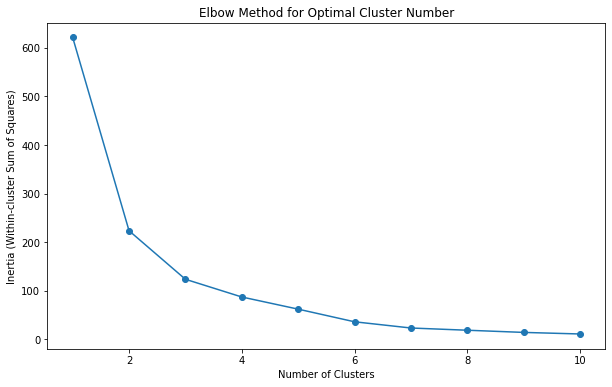

In [19]:
max_clusters = 10
inertia_values = []

for num_clusters in range(1, max_clusters + 1):
    kmeans = KMeans(n_clusters=num_clusters, random_state=42)
    kmeans.fit(X_train)
    inertia_values.append(kmeans.inertia_)

# Plot the Elbow Method graph
plt.figure(figsize=(10, 6))
plt.plot(range(1, max_clusters + 1), inertia_values, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia (Within-cluster Sum of Squares)')
plt.title('Elbow Method for Optimal Cluster Number')
plt.show()

In [20]:
num_clusters = 7
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
cluster_labels = kmeans.fit_predict(X_train)

# Print cluster labels
print("Cluster Labels:", cluster_labels)

Cluster Labels: [4 0 6 ... 5 4 4]


In [21]:
len(cluster_labels)

2706

In [66]:
train_model.shape

(2706, 1149)

In [22]:
app_train_encode = train_model.copy()

In [23]:
app_train_encode["SurgeryName"] = cluster_labels

In [24]:
app_train_encode.head()

,SurgeryName,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combinat

In [25]:
sentences_test = [surgery.split() for surgery in surgery_names_test]


In [26]:
test_model.shape

(1207, 1149)

In [27]:
surgery_embeddings_test = []
for surgery in sentences_test:
    surgery_vector = np.mean([fasttext_model.wv[word] for word in surgery], axis=0)
    
    # Handle empty surgery vectors by replacing with zeros
    if surgery_vector.shape == ():
        surgery_vector = np.zeros((embedding_dim,))
        
    surgery_embeddings_test.append(surgery_vector)

X_test = np.vstack(surgery_embeddings_test)

c:\Users\Furka\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3441: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
c:\Users\Furka\anaconda3\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [28]:
X_test.shape

(1207, 100)

In [29]:
test_cluster_labels = kmeans.predict(X_test)

In [30]:
len(test_cluster_labels)

1207

In [31]:
test_cluster_labels

array([1, 6, 4, ..., 1, 3, 6])

In [102]:
test_model.head(1)

,SurgeryName,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combinat

In [32]:
app_test_encode = test_model.copy()


In [33]:
app_test_encode["SurgeryName"] = test_cluster_labels

In [34]:
app_train_encode.head()


,SurgeryName,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combinat

In [35]:
app_test_encode.head()

,SurgeryName,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combinat

In [36]:
app_train_encode_cluster = pd.get_dummies(app_train_encode, columns=['SurgeryName'], prefix=['SurgeryName'])


In [37]:
app_train_encode_cluster.head()

,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combination_first_5_

In [38]:
app_test_encode_cluster = pd.get_dummies(app_test_encode, columns=['SurgeryName'], prefix=['SurgeryName'])


In [39]:
app_test_encode_cluster.head()

,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combination_first_5_

In [40]:
from sklearn.manifold import TSNE
import plotly.express as px

tsne = TSNE(n_components=2, perplexity=30, random_state=42)
tsne_results = tsne.fit_transform(X_train)

# Create a DataFrame for t-SNE results
tsne_df = pd.DataFrame(tsne_results, columns=['tsne_1', 'tsne_2'])
tsne_df['Cluster'] = cluster_labels
tsne_df['SurgeryName'] = surgery_names_train

# Create hover data
hover_data = {
    'Surgery Name': tsne_df['SurgeryName']
}

# Plot t-SNE visualization with hue for clusters and surgery names using Plotly Express
fig = px.scatter(tsne_df, x='tsne_1', y='tsne_2', color='Cluster', hover_data=hover_data)

# Update layout for title and legend
fig.update_layout(
    title='t-SNE Visualization of Clustered Surgery Names',
    legend=dict(x=1, y=1, bgcolor='rgba(255, 255, 255, 0.5)')
)

# Show the interactive plot
fig.show()


c:\Users\Furka\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
c:\Users\Furka\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


c:\Users\Furka\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:783: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

c:\Users\Furka\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:793: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



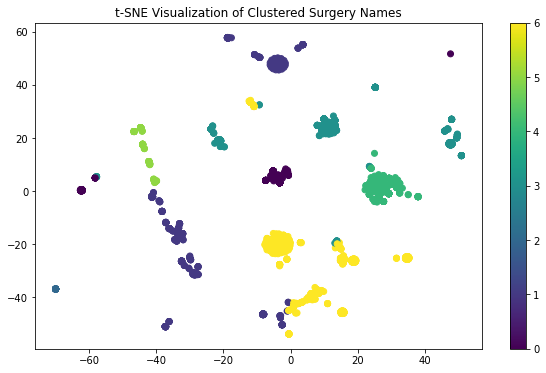

In [41]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, perplexity=30, random_state=42)
tsne_results = tsne.fit_transform(X_train)

# Plot the t-SNE visualization with cluster colors
plt.figure(figsize=(10, 6))
plt.scatter(tsne_results[:, 0], tsne_results[:, 1], c=cluster_labels, cmap='viridis')
plt.title('t-SNE Visualization of Clustered Surgery Names')
plt.colorbar()
plt.show()


In [42]:
models = encode_test(app_train_encode_cluster)

Train shape: (2435, 1154) | Val Shape: (271, 1154)


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[0]	validation_0-rmse:4311.81292	validation_1-rmse:3982.01036
[1]	validation_0-rmse:3343.76764	validation_1-rmse:3027.20412
[2]	validation_0-rmse:2733.43859	validation_1-rmse:2398.00933
[3]	validation_0-rmse:2351.27398	validation_1-rmse:1987.41692
[4]	validation_0-rmse:2104.70299	validation_1-rmse:1714.88516
[5]	validation_0-rmse:1982.68721	validation_1-rmse:1549.03723
[6]	validation_0-rmse:1938.73583	validation_1-rmse:1441.21230
[7]	validation_0-rmse:1901.50598	validation_1-rmse:1386.25472
[8]	validation_0-rmse:1872.90814	validation_1-rmse:1340.25667
[9]	validation_0-rmse:1853.17301	validation_1-rmse:1304.08833
[10]	validation_0-rmse:1830.71150	validation_1-rmse:1277.66009
[11]	validation_0-rmse:1816.73548	validation_1-rmse:1246.62977
[12]	validation_0-rmse:1814.64482	validation_1-rmse:1238.72456
[13]	validation_0-rmse:1810.29429	validation_1-rmse:1221.47707
[14]	validation_0-rmse:1809.32853	validation_1-rmse:1211.79969
[15]	validation_0-rmse:1812.09634	validation_1-rmse:1203.32360
[1

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2780.41176	validation_1-rmse:2377.67545
[3]	validation_0-rmse:2473.26793	validation_1-rmse:1955.92302
[4]	validation_0-rmse:2292.11606	validation_1-rmse:1692.89774
[5]	validation_0-rmse:2181.03242	validation_1-rmse:1526.78161
[6]	validation_0-rmse:2131.09549	validation_1-rmse:1429.34452
[7]	validation_0-rmse:2104.13299	validation_1-rmse:1348.71555
[8]	validation_0-rmse:2078.93807	validation_1-rmse:1303.15854
[9]	validation_0-rmse:2070.01214	validation_1-rmse:1262.74160
[10]	validation_0-rmse:2062.39324	validation_1-rmse:1241.38791
[11]	validation_0-rmse:2053.19935	validation_1-rmse:1220.17847
[12]	validation_0-rmse:2052.24600	validation_1-rmse:1204.40181
[13]	validation_0-rmse:2052.52582	validation_1-rmse:1196.18600
[14]	validation_0-rmse:2050.03350	validation_1-rmse:1180.62017
[15]	validation_0-rmse:2048.56901	validation_1-rmse:1163.33427
[16]	validation_0-rmse:2047.07318	validation_1-rmse:1152.64663
[17]	validation_0-rmse:2043.71677	validation_1-rmse:1146.48121


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2533.05382	validation_1-rmse:2420.58496
[3]	validation_0-rmse:2152.77510	validation_1-rmse:2013.87583
[4]	validation_0-rmse:1936.89800	validation_1-rmse:1766.75885
[5]	validation_0-rmse:1794.56498	validation_1-rmse:1597.68040
[6]	validation_0-rmse:1685.99847	validation_1-rmse:1495.34249
[7]	validation_0-rmse:1621.02214	validation_1-rmse:1409.48368
[8]	validation_0-rmse:1567.28993	validation_1-rmse:1367.41685
[9]	validation_0-rmse:1543.26881	validation_1-rmse:1324.98233
[10]	validation_0-rmse:1527.29384	validation_1-rmse:1299.51280
[11]	validation_0-rmse:1527.41707	validation_1-rmse:1278.27890
[12]	validation_0-rmse:1524.75341	validation_1-rmse:1264.32958
[13]	validation_0-rmse:1520.59018	validation_1-rmse:1251.68551
[14]	validation_0-rmse:1516.58190	validation_1-rmse:1243.73175
[15]	validation_0-rmse:1514.63146	validation_1-rmse:1232.18311
[16]	validation_0-rmse:1502.57899	validation_1-rmse:1224.43443
[17]	validation_0-rmse:1499.56362	validation_1-rmse:1219.11142


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[3]	validation_0-rmse:2112.09340	validation_1-rmse:2016.94919
[4]	validation_0-rmse:1864.15812	validation_1-rmse:1759.38025
[5]	validation_0-rmse:1737.69657	validation_1-rmse:1596.21089
[6]	validation_0-rmse:1656.38314	validation_1-rmse:1478.76529
[7]	validation_0-rmse:1600.69240	validation_1-rmse:1403.74372
[8]	validation_0-rmse:1573.99486	validation_1-rmse:1360.28610
[9]	validation_0-rmse:1559.86830	validation_1-rmse:1326.02743
[10]	validation_0-rmse:1555.94153	validation_1-rmse:1304.05124
[11]	validation_0-rmse:1543.96956	validation_1-rmse:1285.31409
[12]	validation_0-rmse:1543.23644	validation_1-rmse:1273.42763
[13]	validation_0-rmse:1540.18916	validation_1-rmse:1265.65041
[14]	validation_0-rmse:1552.84927	validation_1-rmse:1243.49753
[15]	validation_0-rmse:1564.49815	validation_1-rmse:1229.76978
[16]	validation_0-rmse:1563.91219	validation_1-rmse:1223.50655
[17]	validation_0-rmse:1563.93434	validation_1-rmse:1217.46208
[18]	validation_0-rmse:1561.95802	validation_1-rmse:1212.05926

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2343.40563	validation_1-rmse:2424.61970
[3]	validation_0-rmse:1984.78761	validation_1-rmse:2010.16870
[4]	validation_0-rmse:1794.02700	validation_1-rmse:1754.31681
[5]	validation_0-rmse:1666.17145	validation_1-rmse:1574.44568
[6]	validation_0-rmse:1621.50902	validation_1-rmse:1471.44636
[7]	validation_0-rmse:1594.44199	validation_1-rmse:1402.29611
[8]	validation_0-rmse:1569.30014	validation_1-rmse:1349.99078
[9]	validation_0-rmse:1557.45805	validation_1-rmse:1312.73837
[10]	validation_0-rmse:1556.30683	validation_1-rmse:1294.44508
[11]	validation_0-rmse:1554.65540	validation_1-rmse:1278.17607
[12]	validation_0-rmse:1560.87759	validation_1-rmse:1262.97279
[13]	validation_0-rmse:1560.48481	validation_1-rmse:1256.64077
[14]	validation_0-rmse:1557.44336	validation_1-rmse:1248.28873
[15]	validation_0-rmse:1550.81445	validation_1-rmse:1231.44972
[16]	validation_0-rmse:1548.57517	validation_1-rmse:1219.57568
[17]	validation_0-rmse:1549.97355	validation_1-rmse:1214.15697


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[3]	validation_0-rmse:1993.82670	validation_1-rmse:2004.24894
[4]	validation_0-rmse:1792.25809	validation_1-rmse:1746.44646
[5]	validation_0-rmse:1684.50276	validation_1-rmse:1581.12601
[6]	validation_0-rmse:1624.69534	validation_1-rmse:1482.17341
[7]	validation_0-rmse:1578.33076	validation_1-rmse:1408.17718
[8]	validation_0-rmse:1571.80123	validation_1-rmse:1364.21939
[9]	validation_0-rmse:1564.25132	validation_1-rmse:1330.89896
[10]	validation_0-rmse:1555.40009	validation_1-rmse:1298.27507
[11]	validation_0-rmse:1550.00657	validation_1-rmse:1273.39228
[12]	validation_0-rmse:1553.55526	validation_1-rmse:1263.78022
[13]	validation_0-rmse:1550.98557	validation_1-rmse:1252.07063
[14]	validation_0-rmse:1548.96004	validation_1-rmse:1241.91198
[15]	validation_0-rmse:1546.28533	validation_1-rmse:1229.52866
[16]	validation_0-rmse:1545.81257	validation_1-rmse:1224.40500
[17]	validation_0-rmse:1540.71417	validation_1-rmse:1214.03019
[18]	validation_0-rmse:1540.68763	validation_1-rmse:1208.08572

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[3]	validation_0-rmse:2351.39148	validation_1-rmse:1966.26290
[4]	validation_0-rmse:2159.43198	validation_1-rmse:1707.75691
[5]	validation_0-rmse:2038.16525	validation_1-rmse:1536.62790
[6]	validation_0-rmse:1975.51609	validation_1-rmse:1439.62046
[7]	validation_0-rmse:1958.57971	validation_1-rmse:1374.00856
[8]	validation_0-rmse:1933.82431	validation_1-rmse:1331.26201
[9]	validation_0-rmse:1939.19737	validation_1-rmse:1287.76244
[10]	validation_0-rmse:1931.12905	validation_1-rmse:1263.53762
[11]	validation_0-rmse:1928.06363	validation_1-rmse:1240.80038
[12]	validation_0-rmse:1917.91021	validation_1-rmse:1221.09517
[13]	validation_0-rmse:1920.76666	validation_1-rmse:1205.49669
[14]	validation_0-rmse:1909.27200	validation_1-rmse:1198.51913
[15]	validation_0-rmse:1916.07800	validation_1-rmse:1191.69085
[16]	validation_0-rmse:1914.93562	validation_1-rmse:1186.93421
[17]	validation_0-rmse:1914.00763	validation_1-rmse:1180.72983
[18]	validation_0-rmse:1918.41488	validation_1-rmse:1176.75642

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[3]	validation_0-rmse:1881.33204	validation_1-rmse:2025.22453
[4]	validation_0-rmse:1652.41289	validation_1-rmse:1765.40454
[5]	validation_0-rmse:1533.98815	validation_1-rmse:1590.58408
[6]	validation_0-rmse:1500.01525	validation_1-rmse:1480.26482
[7]	validation_0-rmse:1463.84585	validation_1-rmse:1404.41044
[8]	validation_0-rmse:1434.41221	validation_1-rmse:1349.38852
[9]	validation_0-rmse:1425.30180	validation_1-rmse:1320.76466
[10]	validation_0-rmse:1417.20314	validation_1-rmse:1287.76611
[11]	validation_0-rmse:1403.15067	validation_1-rmse:1273.99465
[12]	validation_0-rmse:1393.66823	validation_1-rmse:1254.28440
[13]	validation_0-rmse:1391.95142	validation_1-rmse:1246.57136
[14]	validation_0-rmse:1384.85659	validation_1-rmse:1237.82321
[15]	validation_0-rmse:1380.03840	validation_1-rmse:1220.86994
[16]	validation_0-rmse:1377.86994	validation_1-rmse:1204.29880
[17]	validation_0-rmse:1376.80463	validation_1-rmse:1200.43682
[18]	validation_0-rmse:1376.31504	validation_1-rmse:1191.54844

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2496.44899	validation_1-rmse:2410.86111
[3]	validation_0-rmse:2088.77211	validation_1-rmse:2004.50107
[4]	validation_0-rmse:1835.08527	validation_1-rmse:1731.64442
[5]	validation_0-rmse:1689.57051	validation_1-rmse:1575.11378
[6]	validation_0-rmse:1622.61794	validation_1-rmse:1477.45720
[7]	validation_0-rmse:1562.23673	validation_1-rmse:1395.25283
[8]	validation_0-rmse:1537.27787	validation_1-rmse:1343.24482
[9]	validation_0-rmse:1522.92912	validation_1-rmse:1315.28922
[10]	validation_0-rmse:1522.02652	validation_1-rmse:1294.71564
[11]	validation_0-rmse:1515.58681	validation_1-rmse:1273.11419
[12]	validation_0-rmse:1515.30023	validation_1-rmse:1248.33445
[13]	validation_0-rmse:1518.25708	validation_1-rmse:1237.21104
[14]	validation_0-rmse:1507.56482	validation_1-rmse:1216.75285
[15]	validation_0-rmse:1511.54940	validation_1-rmse:1204.93140
[16]	validation_0-rmse:1511.18501	validation_1-rmse:1199.33006
[17]	validation_0-rmse:1510.88346	validation_1-rmse:1194.35050


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2326.76442	validation_1-rmse:2419.84603
[3]	validation_0-rmse:1948.78140	validation_1-rmse:2011.11444
[4]	validation_0-rmse:1751.60908	validation_1-rmse:1747.65315
[5]	validation_0-rmse:1623.27796	validation_1-rmse:1576.82381
[6]	validation_0-rmse:1554.16710	validation_1-rmse:1470.82274
[7]	validation_0-rmse:1515.08007	validation_1-rmse:1398.98301
[8]	validation_0-rmse:1485.92869	validation_1-rmse:1344.15476
[9]	validation_0-rmse:1489.54253	validation_1-rmse:1313.95248
[10]	validation_0-rmse:1480.25984	validation_1-rmse:1293.11293
[11]	validation_0-rmse:1476.85050	validation_1-rmse:1267.78200
[12]	validation_0-rmse:1478.44449	validation_1-rmse:1259.10634
[13]	validation_0-rmse:1471.59993	validation_1-rmse:1246.38531
[14]	validation_0-rmse:1468.15691	validation_1-rmse:1239.18502
[15]	validation_0-rmse:1466.38815	validation_1-rmse:1228.99595
[16]	validation_0-rmse:1463.55261	validation_1-rmse:1221.05305
[17]	validation_0-rmse:1464.61209	validation_1-rmse:1207.87045


### Encode with fasttext embeddings then kmeans-7 cluster

In [43]:
encode_submission(app_test_encode_cluster, models)

RMSE: 1338.4052295210442
R^2: 0.8064359414140688
Adjusted R-squared: 0.8062753073405535


### Encode with fasttext embeddings then kmeans-3 cluster

In [113]:
encode_submission(app_test_encode_cluster, models)

RMSE: 1347.7165044269836
R^2: 0.803733325624618
Adjusted R-squared: 0.8035704487164226


## Encoding with Global-Vectors

In [44]:
from sklearn.cluster import KMeans
from gensim.models.doc2vec import Doc2Vec, TaggedDocument
from sklearn.manifold import TSNE

In [45]:
surgery_names_train = train_model["SurgeryName"].to_list()

In [46]:
surgery_names_test = test_model["SurgeryName"].to_list()

In [48]:
all_surgery_names = surgery_names_train + surgery_names_test

In [49]:
len(all_surgery_names)

3913

In [50]:
tagged_data = [TaggedDocument(words=surgery.split(), tags=[str(idx)]) for idx, surgery in enumerate(all_surgery_names)]

In [51]:
embedding_dim = 100
doc2vec_model = Doc2Vec(vector_size=embedding_dim, window=5, min_count=1, dm=1, epochs=10, seed=42)
doc2vec_model.build_vocab(tagged_data)
doc2vec_model.train(tagged_data, total_examples=doc2vec_model.corpus_count, epochs=doc2vec_model.epochs)


In [52]:
surgery_embeddings = [doc2vec_model.dv[str(idx)] for idx in range(len(all_surgery_names))]

In [ ]:
type(surgery_embeddings)

list

In [53]:
len(surgery_names_train)

2706

In [54]:
len(surgery_names_test)


1207

In [58]:
train_results = surgery_embeddings[:2706]
test_results = surgery_embeddings[2706:]

In [60]:
len(train_results)

2706

c:\Users\Furka\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1040: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=11.



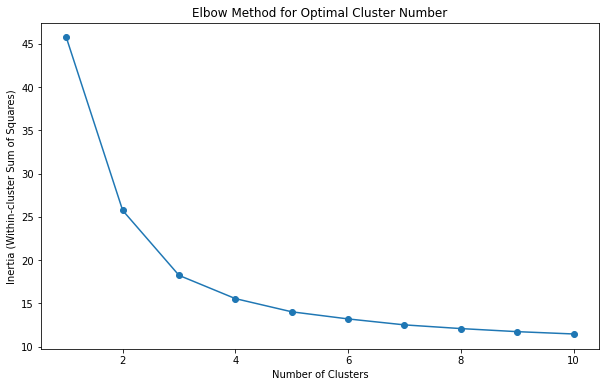

In [61]:
max_clusters = 10
inertia_values = []

for num_clusters in range(1, max_clusters + 1):
    kmeans = KMeans(n_clusters=num_clusters, random_state=42)
    kmeans.fit(train_results)
    inertia_values.append(kmeans.inertia_)

# Plot the Elbow Method graph
plt.figure(figsize=(10, 6))
plt.plot(range(1, max_clusters + 1), inertia_values, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia (Within-cluster Sum of Squares)')
plt.title('Elbow Method for Optimal Cluster Number')
plt.show()

In [62]:
# Perform K-means clustering
num_clusters = 3
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
cluster_labels = kmeans.fit_predict(train_results)

# Print cluster labels
print("Cluster Labels:", cluster_labels)

Cluster Labels: [0 0 0 ... 2 0 2]


In [63]:
test_cluster_labels = kmeans.predict(test_results)


In [66]:
app_train_encode.shape

(2706, 1149)

In [67]:
app_test_encode.shape

(1207, 1149)

In [70]:
len(cluster_labels)

2706

In [64]:
app_train_encode = train_model.copy()
app_test_encode = test_model.copy()


In [68]:
app_train_encode["SurgeryName"] = cluster_labels

In [69]:
app_train_encode.head()

,SurgeryName,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combinat

In [71]:
app_test_encode["SurgeryName"] = test_cluster_labels

In [72]:
app_train_encode.head()


,SurgeryName,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combinat

In [73]:
app_test_encode.head()

,SurgeryName,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combinat

In [74]:
app_train_encode_cluster = pd.get_dummies(app_train_encode, columns=['SurgeryName'], prefix=['SurgeryName'])


In [75]:
app_train_encode_cluster.head()

,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combination_first_5_

In [76]:
app_test_encode_cluster = pd.get_dummies(app_test_encode, columns=['SurgeryName'], prefix=['SurgeryName'])


In [77]:
app_test_encode_cluster.head()

,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combination_first_5_

In [78]:
from sklearn.manifold import TSNE
import plotly.express as px

tsne = TSNE(n_components=2, perplexity=30, random_state=42)
tsne_results = tsne.fit_transform(train_results)

# Create a DataFrame for t-SNE results
tsne_df = pd.DataFrame(tsne_results, columns=['tsne_1', 'tsne_2'])
tsne_df['Cluster'] = cluster_labels
tsne_df['SurgeryName'] = surgery_names_train

# Create hover data
hover_data = {
    'Surgery Name': tsne_df['SurgeryName']
}

# Plot t-SNE visualization with hue for clusters and surgery names using Plotly Express
fig = px.scatter(tsne_df, x='tsne_1', y='tsne_2', color='Cluster', hover_data=hover_data)

# Update layout for title and legend
fig.update_layout(
    title='t-SNE Visualization of Clustered Surgery Names',
    legend=dict(x=1, y=1, bgcolor='rgba(255, 255, 255, 0.5)')
)

# Show the interactive plot
fig.show()


c:\Users\Furka\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:783: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

c:\Users\Furka\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:793: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



c:\Users\Furka\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:783: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

c:\Users\Furka\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:793: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



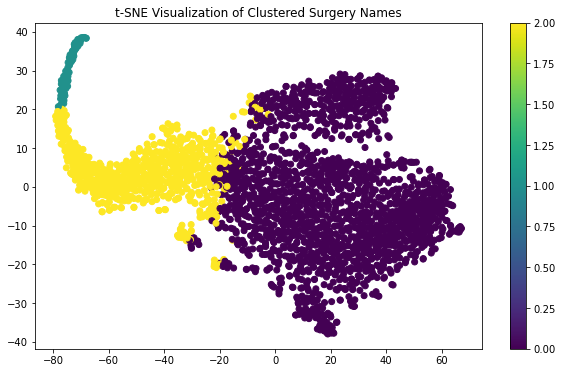

In [79]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, perplexity=30, random_state=42)
tsne_results = tsne.fit_transform(train_results)

# Plot the t-SNE visualization with cluster colors
plt.figure(figsize=(10, 6))
plt.scatter(tsne_results[:, 0], tsne_results[:, 1], c=cluster_labels, cmap='viridis')
plt.title('t-SNE Visualization of Clustered Surgery Names')
plt.colorbar()
plt.show()


In [80]:
models = encode_test(app_train_encode_cluster)

Train shape: (2435, 1150) | Val Shape: (271, 1150)
[0]	validation_0-rmse:4306.27675	validation_1-rmse:3982.01060
[1]	validation_0-rmse:3341.89978	validation_1-rmse:3028.27856
[2]	validation_0-rmse:2730.16243	validation_1-rmse:2398.58959


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[3]	validation_0-rmse:2349.78297	validation_1-rmse:1991.60045
[4]	validation_0-rmse:2108.65202	validation_1-rmse:1715.16107
[5]	validation_0-rmse:2010.35483	validation_1-rmse:1556.05300
[6]	validation_0-rmse:1959.21179	validation_1-rmse:1459.96862
[7]	validation_0-rmse:1925.68356	validation_1-rmse:1391.39007
[8]	validation_0-rmse:1885.62190	validation_1-rmse:1345.89781
[9]	validation_0-rmse:1872.81387	validation_1-rmse:1320.75872
[10]	validation_0-rmse:1846.79438	validation_1-rmse:1287.51993
[11]	validation_0-rmse:1823.99178	validation_1-rmse:1269.03653
[12]	validation_0-rmse:1818.01495	validation_1-rmse:1257.07093
[13]	validation_0-rmse:1817.35110	validation_1-rmse:1249.34289
[14]	validation_0-rmse:1812.98543	validation_1-rmse:1238.43511
[15]	validation_0-rmse:1810.06419	validation_1-rmse:1223.21619
[16]	validation_0-rmse:1810.91481	validation_1-rmse:1218.21193
[17]	validation_0-rmse:1807.03937	validation_1-rmse:1203.93145
[18]	validation_0-rmse:1807.21498	validation_1-rmse:1198.70112

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[3]	validation_0-rmse:2451.08895	validation_1-rmse:1959.84431
[4]	validation_0-rmse:2259.44601	validation_1-rmse:1699.53868
[5]	validation_0-rmse:2174.79319	validation_1-rmse:1531.48828
[6]	validation_0-rmse:2129.28741	validation_1-rmse:1436.51441
[7]	validation_0-rmse:2102.41639	validation_1-rmse:1374.58432
[8]	validation_0-rmse:2080.64088	validation_1-rmse:1315.32414
[9]	validation_0-rmse:2079.78654	validation_1-rmse:1289.63692
[10]	validation_0-rmse:2070.14729	validation_1-rmse:1262.39484
[11]	validation_0-rmse:2062.62222	validation_1-rmse:1238.10577
[12]	validation_0-rmse:2063.51424	validation_1-rmse:1222.29988
[13]	validation_0-rmse:2069.59955	validation_1-rmse:1208.06760
[14]	validation_0-rmse:2071.98602	validation_1-rmse:1198.07077
[15]	validation_0-rmse:2078.11144	validation_1-rmse:1188.84525
[16]	validation_0-rmse:2074.83394	validation_1-rmse:1169.19318
[17]	validation_0-rmse:2075.30966	validation_1-rmse:1162.91456
[18]	validation_0-rmse:2074.85708	validation_1-rmse:1158.20870

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[4]	validation_0-rmse:1916.76760	validation_1-rmse:1759.23948
[5]	validation_0-rmse:1760.36392	validation_1-rmse:1595.05148
[6]	validation_0-rmse:1664.58902	validation_1-rmse:1497.59498
[7]	validation_0-rmse:1616.22697	validation_1-rmse:1432.29325
[8]	validation_0-rmse:1592.10015	validation_1-rmse:1394.43255
[9]	validation_0-rmse:1563.76885	validation_1-rmse:1357.10225
[10]	validation_0-rmse:1541.71630	validation_1-rmse:1319.15183
[11]	validation_0-rmse:1541.04831	validation_1-rmse:1297.39274
[12]	validation_0-rmse:1532.94078	validation_1-rmse:1287.04583
[13]	validation_0-rmse:1528.21815	validation_1-rmse:1270.88421
[14]	validation_0-rmse:1528.19258	validation_1-rmse:1260.60580
[15]	validation_0-rmse:1523.47816	validation_1-rmse:1247.68423
[16]	validation_0-rmse:1518.14465	validation_1-rmse:1239.92491
[17]	validation_0-rmse:1518.91707	validation_1-rmse:1233.93607
[18]	validation_0-rmse:1521.20050	validation_1-rmse:1222.93676
[19]	validation_0-rmse:1520.85689	validation_1-rmse:1210.4106

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[4]	validation_0-rmse:1841.99282	validation_1-rmse:1753.33322
[5]	validation_0-rmse:1698.67754	validation_1-rmse:1580.35783
[6]	validation_0-rmse:1593.45046	validation_1-rmse:1470.12866
[7]	validation_0-rmse:1558.89134	validation_1-rmse:1406.64224
[8]	validation_0-rmse:1529.63922	validation_1-rmse:1356.42207
[9]	validation_0-rmse:1513.79479	validation_1-rmse:1322.66386
[10]	validation_0-rmse:1505.33312	validation_1-rmse:1303.66807
[11]	validation_0-rmse:1492.97536	validation_1-rmse:1288.40217
[12]	validation_0-rmse:1491.10604	validation_1-rmse:1275.52520
[13]	validation_0-rmse:1489.45288	validation_1-rmse:1260.59250
[14]	validation_0-rmse:1480.90902	validation_1-rmse:1245.85240
[15]	validation_0-rmse:1478.12425	validation_1-rmse:1238.65556
[16]	validation_0-rmse:1477.92967	validation_1-rmse:1230.94389
[17]	validation_0-rmse:1477.36473	validation_1-rmse:1225.22972
[18]	validation_0-rmse:1480.83915	validation_1-rmse:1217.01262
[19]	validation_0-rmse:1479.18040	validation_1-rmse:1199.2010

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[3]	validation_0-rmse:1988.12726	validation_1-rmse:2011.11613
[4]	validation_0-rmse:1800.37661	validation_1-rmse:1751.67576
[5]	validation_0-rmse:1698.48438	validation_1-rmse:1589.50829
[6]	validation_0-rmse:1634.79573	validation_1-rmse:1495.35059
[7]	validation_0-rmse:1598.76338	validation_1-rmse:1423.17466
[8]	validation_0-rmse:1572.30059	validation_1-rmse:1375.81829
[9]	validation_0-rmse:1560.76293	validation_1-rmse:1332.33187
[10]	validation_0-rmse:1557.69889	validation_1-rmse:1305.44636
[11]	validation_0-rmse:1547.95154	validation_1-rmse:1286.10001
[12]	validation_0-rmse:1541.89215	validation_1-rmse:1263.21996
[13]	validation_0-rmse:1545.59211	validation_1-rmse:1247.24175
[14]	validation_0-rmse:1547.90169	validation_1-rmse:1240.02196
[15]	validation_0-rmse:1548.48877	validation_1-rmse:1219.72792
[16]	validation_0-rmse:1550.37437	validation_1-rmse:1204.49021
[17]	validation_0-rmse:1547.37814	validation_1-rmse:1199.98903
[18]	validation_0-rmse:1549.38161	validation_1-rmse:1191.80737

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[4]	validation_0-rmse:1763.15552	validation_1-rmse:1745.01965
[5]	validation_0-rmse:1648.37440	validation_1-rmse:1575.87690
[6]	validation_0-rmse:1582.31751	validation_1-rmse:1474.20536
[7]	validation_0-rmse:1549.85404	validation_1-rmse:1403.83737
[8]	validation_0-rmse:1529.05088	validation_1-rmse:1366.82644
[9]	validation_0-rmse:1502.53923	validation_1-rmse:1328.82773
[10]	validation_0-rmse:1479.91524	validation_1-rmse:1295.91791
[11]	validation_0-rmse:1474.16843	validation_1-rmse:1272.43006
[12]	validation_0-rmse:1474.14499	validation_1-rmse:1247.75766
[13]	validation_0-rmse:1478.74881	validation_1-rmse:1237.38152
[14]	validation_0-rmse:1470.97252	validation_1-rmse:1224.29874
[15]	validation_0-rmse:1474.95158	validation_1-rmse:1206.39702
[16]	validation_0-rmse:1474.27657	validation_1-rmse:1199.70259
[17]	validation_0-rmse:1473.23871	validation_1-rmse:1189.11391
[18]	validation_0-rmse:1477.34631	validation_1-rmse:1180.89948
[19]	validation_0-rmse:1477.16073	validation_1-rmse:1176.7665

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[3]	validation_0-rmse:2343.88603	validation_1-rmse:1963.84276
[4]	validation_0-rmse:2145.24599	validation_1-rmse:1703.77739
[5]	validation_0-rmse:2028.41831	validation_1-rmse:1531.06414
[6]	validation_0-rmse:1976.81767	validation_1-rmse:1424.88183
[7]	validation_0-rmse:1941.40974	validation_1-rmse:1368.08761
[8]	validation_0-rmse:1921.76786	validation_1-rmse:1319.98594
[9]	validation_0-rmse:1914.66770	validation_1-rmse:1279.99704
[10]	validation_0-rmse:1895.86026	validation_1-rmse:1260.07895
[11]	validation_0-rmse:1890.06365	validation_1-rmse:1233.62966
[12]	validation_0-rmse:1884.88101	validation_1-rmse:1218.94000
[13]	validation_0-rmse:1882.34263	validation_1-rmse:1210.20959
[14]	validation_0-rmse:1876.21873	validation_1-rmse:1202.36218
[15]	validation_0-rmse:1874.02374	validation_1-rmse:1183.73488
[16]	validation_0-rmse:1875.36071	validation_1-rmse:1175.35655
[17]	validation_0-rmse:1879.00344	validation_1-rmse:1167.19190
[18]	validation_0-rmse:1871.33657	validation_1-rmse:1157.76756

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2259.77865	validation_1-rmse:2437.72375
[3]	validation_0-rmse:1879.89804	validation_1-rmse:2021.81075
[4]	validation_0-rmse:1649.33477	validation_1-rmse:1757.76862
[5]	validation_0-rmse:1522.20761	validation_1-rmse:1586.63653
[6]	validation_0-rmse:1444.25300	validation_1-rmse:1482.77945
[7]	validation_0-rmse:1401.34359	validation_1-rmse:1418.49880
[8]	validation_0-rmse:1387.28713	validation_1-rmse:1374.90784
[9]	validation_0-rmse:1374.62746	validation_1-rmse:1333.96667
[10]	validation_0-rmse:1368.35441	validation_1-rmse:1314.95543
[11]	validation_0-rmse:1355.81872	validation_1-rmse:1297.19909
[12]	validation_0-rmse:1344.87910	validation_1-rmse:1275.22607
[13]	validation_0-rmse:1337.08721	validation_1-rmse:1264.79379
[14]	validation_0-rmse:1338.70215	validation_1-rmse:1249.21644
[15]	validation_0-rmse:1335.74395	validation_1-rmse:1235.16344
[16]	validation_0-rmse:1333.22233	validation_1-rmse:1227.61064
[17]	validation_0-rmse:1333.93498	validation_1-rmse:1216.66936


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[3]	validation_0-rmse:2086.06814	validation_1-rmse:1999.18305
[4]	validation_0-rmse:1841.34580	validation_1-rmse:1749.99607
[5]	validation_0-rmse:1712.63186	validation_1-rmse:1586.31085
[6]	validation_0-rmse:1623.81543	validation_1-rmse:1474.31745
[7]	validation_0-rmse:1572.32414	validation_1-rmse:1405.75872
[8]	validation_0-rmse:1546.42470	validation_1-rmse:1351.96291
[9]	validation_0-rmse:1526.78646	validation_1-rmse:1311.32727
[10]	validation_0-rmse:1527.82903	validation_1-rmse:1283.15301
[11]	validation_0-rmse:1527.44148	validation_1-rmse:1264.20568
[12]	validation_0-rmse:1524.04081	validation_1-rmse:1251.67702
[13]	validation_0-rmse:1519.74243	validation_1-rmse:1243.56549
[14]	validation_0-rmse:1515.34498	validation_1-rmse:1228.92377
[15]	validation_0-rmse:1516.56018	validation_1-rmse:1219.47528
[16]	validation_0-rmse:1517.79640	validation_1-rmse:1207.09863
[17]	validation_0-rmse:1517.06735	validation_1-rmse:1202.00971
[18]	validation_0-rmse:1517.15088	validation_1-rmse:1195.93431

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[3]	validation_0-rmse:1959.93215	validation_1-rmse:2016.16155
[4]	validation_0-rmse:1750.22403	validation_1-rmse:1757.71793
[5]	validation_0-rmse:1639.15400	validation_1-rmse:1579.70476
[6]	validation_0-rmse:1545.49674	validation_1-rmse:1463.50210
[7]	validation_0-rmse:1511.15638	validation_1-rmse:1406.00619
[8]	validation_0-rmse:1494.03141	validation_1-rmse:1364.11675
[9]	validation_0-rmse:1484.13335	validation_1-rmse:1324.48600
[10]	validation_0-rmse:1488.82567	validation_1-rmse:1304.28885
[11]	validation_0-rmse:1476.59131	validation_1-rmse:1280.27833
[12]	validation_0-rmse:1465.10355	validation_1-rmse:1265.76379
[13]	validation_0-rmse:1461.05237	validation_1-rmse:1252.16159
[14]	validation_0-rmse:1457.61347	validation_1-rmse:1243.52221
[15]	validation_0-rmse:1456.49759	validation_1-rmse:1238.06186
[16]	validation_0-rmse:1454.63407	validation_1-rmse:1221.96313
[17]	validation_0-rmse:1445.65899	validation_1-rmse:1203.16328
[18]	validation_0-rmse:1447.31725	validation_1-rmse:1199.11919

### Encode with doc2vec embedding kmeans3 cluster

In [81]:
encode_submission(app_test_encode_cluster, models)

RMSE: 1340.1188434235066
R^2: 0.8059399684529726
Adjusted R-squared: 0.8057789227836389


## Encoding with Smooth Inverse Frequency (Fasttext)

In [9]:
from gensim.models import FastText
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans

In [10]:
surgery_names_train = train_model["SurgeryName"].to_list()


In [11]:
surgery_names_test = test_model["SurgeryName"].to_list()

In [ ]:
string_list_train = [surgery.replace('|', ' ') for surgery in string_list_train]
string_list_test = [surgery.replace('|', ' ') for surgery in string_list_test]


In [12]:
import re
def custom_tokenizer(text):
    return re.findall(r'\b\w+\b', text)

In [13]:
tfidf_vectorizer = TfidfVectorizer(tokenizer=custom_tokenizer)
tfidf_matrix_train = tfidf_vectorizer.fit_transform(surgery_names_train)
tfidf_matrix_test = tfidf_vectorizer.transform(surgery_names_test)

In [14]:
words = tfidf_vectorizer.get_feature_names()
idf_values = tfidf_vectorizer.idf_

c:\Users\Furka\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


In [15]:
embedding_dim = 100
fasttext_model = FastText(sentences=[surgery.split() for surgery in surgery_names_train], vector_size=embedding_dim, window=5, min_count=1, sg=1)


In [16]:
sif_embeddings_train = []
for doc in surgery_names_train:
    tokens = custom_tokenizer(doc)
    doc_vector = np.zeros(embedding_dim)
    words_in_vocab = 0
    for word in tokens:
        if word in fasttext_model.wv.key_to_index:
            word_vector = fasttext_model.wv[word]
            idf_index = words.index(word) if word in words else -1  # Default index to -1 if word not in words list
            weight = idf_values[idf_index] if idf_index >= 0 else 1.0  # Default weight to 1.0 if index is -1
            doc_vector += (weight / (weight + 1)) * word_vector  # SIF weighting
            words_in_vocab += 1
    if words_in_vocab > 0:
        doc_vector /= words_in_vocab
    sif_embeddings_train.append(doc_vector)

# Perform K-means clustering on train data embeddings
X_train = np.array(sif_embeddings_train)

In [17]:
X_train.shape

(2706, 100)

In [ ]:
X_train

array([[ 0.0571149 ,  0.05784151,  0.01051309, ..., -0.12125596,
        -0.0140222 , -0.00266073],
       [ 0.01412931,  0.01861833,  0.00082831, ..., -0.03740743,
        -0.00368221, -0.00326133],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       ...,
       [ 0.03159013,  0.04366608,  0.02097185, ..., -0.10370408,
        -0.00616711,  0.00886302],
       [ 0.1395653 ,  0.13607451,  0.02172086, ..., -0.28057478,
        -0.04025154, -0.00261896],
       [ 0.00425441,  0.00387171,  0.00130683, ..., -0.0068911 ,
        -0.00109761,  0.00036704]])

c:\Users\Furka\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1040: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=11.
  "KMeans is known to have a memory leak on Windows "


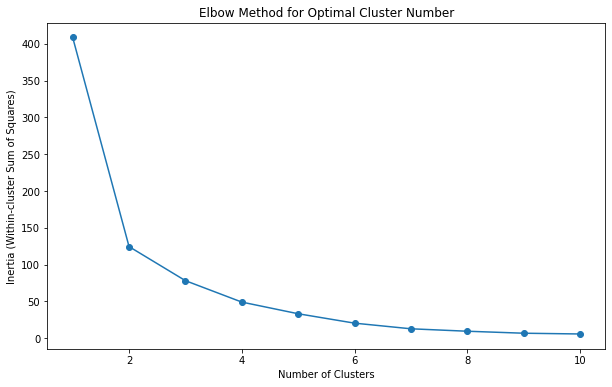

In [18]:
max_clusters = 10
inertia_values = []

for num_clusters in range(1, max_clusters + 1):
    kmeans = KMeans(n_clusters=num_clusters, random_state=42)
    kmeans.fit(X_train)
    inertia_values.append(kmeans.inertia_)

# Plot the Elbow Method graph
plt.figure(figsize=(10, 6))
plt.plot(range(1, max_clusters + 1), inertia_values, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia (Within-cluster Sum of Squares)')
plt.title('Elbow Method for Optimal Cluster Number')
plt.show()

In [19]:
num_clusters = 2
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
cluster_labels = kmeans.fit_predict(X_train)

# Print cluster labels
print("Cluster Labels:", cluster_labels)

Cluster Labels: [0 0 1 ... 1 0 0]


In [20]:
len(cluster_labels)

2706

In [21]:
app_train_encode = train_model.copy()
app_test_encode = test_model.copy()


In [22]:
app_train_encode["SurgeryName"] = cluster_labels

In [23]:
app_train_encode.head()

,SurgeryName,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combinat

In [24]:
sif_embeddings_test = []
for doc in surgery_names_test:
    tokens = custom_tokenizer(doc)
    doc_vector = np.zeros(embedding_dim)
    words_in_vocab = 0
    for word in tokens:
        if word in fasttext_model.wv.key_to_index:
            word_vector = fasttext_model.wv[word]
            idf_index = words.index(word) if word in words else -1  # Default index to -1 if word not in words list
            weight = idf_values[idf_index] if idf_index >= 0 else 1.0  # Default weight to 1.0 if index is -1
            doc_vector += (weight / (weight + 1)) * word_vector  # SIF weighting
            words_in_vocab += 1
    if words_in_vocab > 0:
        doc_vector /= words_in_vocab
    sif_embeddings_test.append(doc_vector)

# Perform K-means clustering on test data embeddings
X_test = np.array(sif_embeddings_test)

In [25]:
app_test_encode.shape

(1207, 1149)

In [107]:
X_test.shape

(1207, 100)

In [26]:
test_cluster_labels = kmeans.predict(X_test)

In [27]:
len(test_cluster_labels)

1207

In [28]:
test_cluster_labels

array([1, 0, 0, ..., 1, 0, 0])

In [29]:
app_test_encode["SurgeryName"] = test_cluster_labels

In [30]:
app_train_encode.head()


,SurgeryName,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combinat

In [31]:
app_test_encode.head()

,SurgeryName,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combinat

In [32]:
app_train_encode_cluster = pd.get_dummies(app_train_encode, columns=['SurgeryName'], prefix=['SurgeryName'])


In [33]:
app_train_encode_cluster.head()

,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combination_first_5_

In [34]:
app_test_encode_cluster = pd.get_dummies(app_test_encode, columns=['SurgeryName'], prefix=['SurgeryName'])


In [35]:
app_test_encode_cluster.head()

,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combination_first_5_

In [36]:
from sklearn.manifold import TSNE
import plotly.express as px

tsne = TSNE(n_components=2, perplexity=30, random_state=42)
tsne_results = tsne.fit_transform(X_train)

# Create a DataFrame for t-SNE results
tsne_df = pd.DataFrame(tsne_results, columns=['tsne_1', 'tsne_2'])
tsne_df['Cluster'] = cluster_labels
tsne_df['SurgeryName'] = surgery_names_train

# Create hover data
hover_data = {
    'Surgery Name': tsne_df['SurgeryName']
}

# Plot t-SNE visualization with hue for clusters and surgery names using Plotly Express
fig = px.scatter(tsne_df, x='tsne_1', y='tsne_2', color='Cluster', hover_data=hover_data)

# Update layout for title and legend
fig.update_layout(
    title='t-SNE Visualization of Clustered Surgery Names',
    legend=dict(x=1, y=1, bgcolor='rgba(255, 255, 255, 0.5)')
)

# Show the interactive plot
fig.show()


c:\Users\Furka\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
c:\Users\Furka\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


c:\Users\Furka\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:783: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

c:\Users\Furka\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:793: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



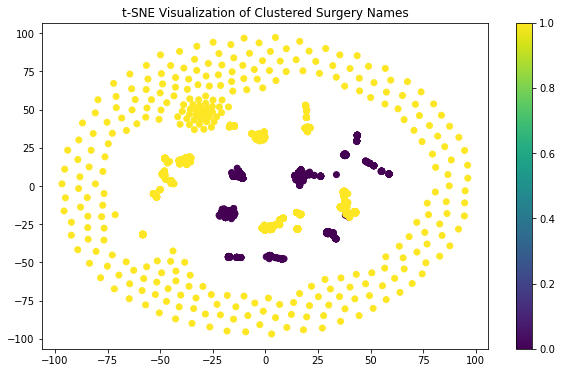

In [37]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, perplexity=30, random_state=42)
tsne_results = tsne.fit_transform(X_train)

# Plot the t-SNE visualization with cluster colors
plt.figure(figsize=(10, 6))
plt.scatter(tsne_results[:, 0], tsne_results[:, 1], c=cluster_labels, cmap='viridis')
plt.title('t-SNE Visualization of Clustered Surgery Names')
plt.colorbar()
plt.show()


In [41]:
models = encode_test(app_train_encode_cluster)

Train shape: (2435, 1149) | Val Shape: (271, 1149)
[0]	validation_0-rmse:4306.27675	validation_1-rmse:3982.01060
[1]	validation_0-rmse:3341.89978	validation_1-rmse:3028.27856
[2]	validation_0-rmse:2730.16243	validation_1-rmse:2398.58959


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[3]	validation_0-rmse:2349.91023	validation_1-rmse:1991.42216
[4]	validation_0-rmse:2108.98041	validation_1-rmse:1714.85951
[5]	validation_0-rmse:2006.67600	validation_1-rmse:1559.49067
[6]	validation_0-rmse:1918.47991	validation_1-rmse:1457.72090
[7]	validation_0-rmse:1866.12429	validation_1-rmse:1383.65476
[8]	validation_0-rmse:1841.64240	validation_1-rmse:1342.43661
[9]	validation_0-rmse:1823.01236	validation_1-rmse:1305.35246
[10]	validation_0-rmse:1805.17084	validation_1-rmse:1277.24037
[11]	validation_0-rmse:1801.07101	validation_1-rmse:1264.56347
[12]	validation_0-rmse:1797.25085	validation_1-rmse:1256.03021
[13]	validation_0-rmse:1792.33044	validation_1-rmse:1243.87536
[14]	validation_0-rmse:1789.18810	validation_1-rmse:1230.76352
[15]	validation_0-rmse:1784.85205	validation_1-rmse:1218.06388
[16]	validation_0-rmse:1784.21317	validation_1-rmse:1212.00876
[17]	validation_0-rmse:1783.98019	validation_1-rmse:1205.14278
[18]	validation_0-rmse:1787.59900	validation_1-rmse:1200.02811

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[3]	validation_0-rmse:2455.44584	validation_1-rmse:1959.92296
[4]	validation_0-rmse:2274.11320	validation_1-rmse:1698.98960
[5]	validation_0-rmse:2175.25276	validation_1-rmse:1531.83060
[6]	validation_0-rmse:2116.97625	validation_1-rmse:1435.51071
[7]	validation_0-rmse:2086.75276	validation_1-rmse:1370.62379
[8]	validation_0-rmse:2073.40939	validation_1-rmse:1314.50780
[9]	validation_0-rmse:2063.74226	validation_1-rmse:1281.55507
[10]	validation_0-rmse:2064.46827	validation_1-rmse:1264.71198
[11]	validation_0-rmse:2063.98712	validation_1-rmse:1246.30037
[12]	validation_0-rmse:2065.55005	validation_1-rmse:1228.90613
[13]	validation_0-rmse:2059.09720	validation_1-rmse:1215.40534
[14]	validation_0-rmse:2060.63323	validation_1-rmse:1206.16949
[15]	validation_0-rmse:2060.83034	validation_1-rmse:1196.01831
[16]	validation_0-rmse:2062.15366	validation_1-rmse:1183.72994
[17]	validation_0-rmse:2064.32473	validation_1-rmse:1175.44053
[18]	validation_0-rmse:2063.75659	validation_1-rmse:1169.68541

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[3]	validation_0-rmse:2146.03380	validation_1-rmse:2016.95552
[4]	validation_0-rmse:1902.32539	validation_1-rmse:1763.73863
[5]	validation_0-rmse:1754.96728	validation_1-rmse:1592.74404
[6]	validation_0-rmse:1655.22938	validation_1-rmse:1484.30287
[7]	validation_0-rmse:1601.29775	validation_1-rmse:1416.06052
[8]	validation_0-rmse:1559.73440	validation_1-rmse:1369.21124
[9]	validation_0-rmse:1537.82243	validation_1-rmse:1331.41532
[10]	validation_0-rmse:1520.68691	validation_1-rmse:1310.04527
[11]	validation_0-rmse:1512.42666	validation_1-rmse:1292.71602
[12]	validation_0-rmse:1491.61279	validation_1-rmse:1268.65989
[13]	validation_0-rmse:1488.57295	validation_1-rmse:1260.67337
[14]	validation_0-rmse:1483.13356	validation_1-rmse:1251.88893
[15]	validation_0-rmse:1484.46035	validation_1-rmse:1242.00613
[16]	validation_0-rmse:1483.66076	validation_1-rmse:1234.74613
[17]	validation_0-rmse:1479.90427	validation_1-rmse:1227.08516
[18]	validation_0-rmse:1475.86165	validation_1-rmse:1221.97385

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2472.48330	validation_1-rmse:2419.34863
[3]	validation_0-rmse:2085.55470	validation_1-rmse:2014.48757
[4]	validation_0-rmse:1856.00803	validation_1-rmse:1755.04406
[5]	validation_0-rmse:1722.85654	validation_1-rmse:1587.41308
[6]	validation_0-rmse:1645.71030	validation_1-rmse:1484.14454
[7]	validation_0-rmse:1585.88925	validation_1-rmse:1395.68813
[8]	validation_0-rmse:1561.27600	validation_1-rmse:1355.22496
[9]	validation_0-rmse:1537.66809	validation_1-rmse:1316.91868
[10]	validation_0-rmse:1529.28806	validation_1-rmse:1291.53016
[11]	validation_0-rmse:1527.93903	validation_1-rmse:1272.90687
[12]	validation_0-rmse:1506.77581	validation_1-rmse:1256.13874
[13]	validation_0-rmse:1505.89544	validation_1-rmse:1246.99263
[14]	validation_0-rmse:1504.67353	validation_1-rmse:1229.24917
[15]	validation_0-rmse:1506.63879	validation_1-rmse:1221.95018
[16]	validation_0-rmse:1506.35395	validation_1-rmse:1217.36226
[17]	validation_0-rmse:1503.07139	validation_1-rmse:1210.93553


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2340.36355	validation_1-rmse:2428.91537
[3]	validation_0-rmse:1981.72363	validation_1-rmse:2012.94065
[4]	validation_0-rmse:1789.74719	validation_1-rmse:1745.30965
[5]	validation_0-rmse:1708.77538	validation_1-rmse:1588.59846
[6]	validation_0-rmse:1663.53191	validation_1-rmse:1485.94348
[7]	validation_0-rmse:1618.88689	validation_1-rmse:1413.90941
[8]	validation_0-rmse:1601.45602	validation_1-rmse:1368.88540
[9]	validation_0-rmse:1598.52760	validation_1-rmse:1318.42486
[10]	validation_0-rmse:1589.26653	validation_1-rmse:1292.77005
[11]	validation_0-rmse:1588.07130	validation_1-rmse:1281.62180
[12]	validation_0-rmse:1581.71346	validation_1-rmse:1257.78084
[13]	validation_0-rmse:1579.59003	validation_1-rmse:1250.80180
[14]	validation_0-rmse:1580.41115	validation_1-rmse:1238.60929
[15]	validation_0-rmse:1582.37265	validation_1-rmse:1231.69920
[16]	validation_0-rmse:1584.76101	validation_1-rmse:1225.85775
[17]	validation_0-rmse:1578.83984	validation_1-rmse:1215.98073


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[1]	validation_0-rmse:2922.45253	validation_1-rmse:3057.82610
[2]	validation_0-rmse:2327.18007	validation_1-rmse:2422.22237
[3]	validation_0-rmse:1969.62638	validation_1-rmse:2009.51593
[4]	validation_0-rmse:1768.23926	validation_1-rmse:1747.24797
[5]	validation_0-rmse:1664.05418	validation_1-rmse:1578.04510
[6]	validation_0-rmse:1624.88565	validation_1-rmse:1482.37290
[7]	validation_0-rmse:1591.40153	validation_1-rmse:1421.14391
[8]	validation_0-rmse:1584.13668	validation_1-rmse:1371.02050
[9]	validation_0-rmse:1578.59425	validation_1-rmse:1336.17090
[10]	validation_0-rmse:1569.89531	validation_1-rmse:1319.63314
[11]	validation_0-rmse:1570.33820	validation_1-rmse:1300.74856
[12]	validation_0-rmse:1578.30567	validation_1-rmse:1284.20531
[13]	validation_0-rmse:1576.09619	validation_1-rmse:1275.44187
[14]	validation_0-rmse:1575.54634	validation_1-rmse:1268.69100
[15]	validation_0-rmse:1574.03411	validation_1-rmse:1262.95692
[16]	validation_0-rmse:1570.71165	validation_1-rmse:1255.87645
[

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2719.72284	validation_1-rmse:2382.50023
[3]	validation_0-rmse:2343.58071	validation_1-rmse:1967.61496
[4]	validation_0-rmse:2143.53641	validation_1-rmse:1710.69426
[5]	validation_0-rmse:2036.03383	validation_1-rmse:1538.29724
[6]	validation_0-rmse:1977.57231	validation_1-rmse:1446.93206
[7]	validation_0-rmse:1924.38403	validation_1-rmse:1370.72813
[8]	validation_0-rmse:1908.77921	validation_1-rmse:1329.12180
[9]	validation_0-rmse:1883.98772	validation_1-rmse:1287.99892
[10]	validation_0-rmse:1873.24506	validation_1-rmse:1258.92327
[11]	validation_0-rmse:1872.94873	validation_1-rmse:1243.80387
[12]	validation_0-rmse:1884.12786	validation_1-rmse:1226.05776
[13]	validation_0-rmse:1881.30649	validation_1-rmse:1214.02289
[14]	validation_0-rmse:1876.46319	validation_1-rmse:1207.92805
[15]	validation_0-rmse:1876.15008	validation_1-rmse:1202.70930
[16]	validation_0-rmse:1874.87706	validation_1-rmse:1192.59424
[17]	validation_0-rmse:1876.65487	validation_1-rmse:1186.99714


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2264.51715	validation_1-rmse:2436.89778
[3]	validation_0-rmse:1899.20429	validation_1-rmse:2027.04112
[4]	validation_0-rmse:1687.90162	validation_1-rmse:1760.52499
[5]	validation_0-rmse:1560.69499	validation_1-rmse:1598.49180
[6]	validation_0-rmse:1483.28272	validation_1-rmse:1498.24498
[7]	validation_0-rmse:1442.23566	validation_1-rmse:1433.51646
[8]	validation_0-rmse:1414.84330	validation_1-rmse:1388.15543
[9]	validation_0-rmse:1393.49809	validation_1-rmse:1348.44016
[10]	validation_0-rmse:1379.55304	validation_1-rmse:1325.38460
[11]	validation_0-rmse:1376.31590	validation_1-rmse:1311.38456
[12]	validation_0-rmse:1367.94989	validation_1-rmse:1296.90139
[13]	validation_0-rmse:1362.10877	validation_1-rmse:1282.27471
[14]	validation_0-rmse:1360.70025	validation_1-rmse:1274.44808
[15]	validation_0-rmse:1360.00193	validation_1-rmse:1260.67251
[16]	validation_0-rmse:1358.23959	validation_1-rmse:1250.86481
[17]	validation_0-rmse:1357.73210	validation_1-rmse:1246.25181


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[3]	validation_0-rmse:2087.43111	validation_1-rmse:1999.07092
[4]	validation_0-rmse:1842.38245	validation_1-rmse:1749.87396
[5]	validation_0-rmse:1718.74319	validation_1-rmse:1590.86680
[6]	validation_0-rmse:1623.62094	validation_1-rmse:1477.07792
[7]	validation_0-rmse:1576.44324	validation_1-rmse:1411.56243
[8]	validation_0-rmse:1549.78016	validation_1-rmse:1366.27039
[9]	validation_0-rmse:1536.35679	validation_1-rmse:1317.97630
[10]	validation_0-rmse:1530.21596	validation_1-rmse:1294.26423
[11]	validation_0-rmse:1523.47774	validation_1-rmse:1276.66165
[12]	validation_0-rmse:1521.94203	validation_1-rmse:1259.04053
[13]	validation_0-rmse:1511.19321	validation_1-rmse:1242.28521
[14]	validation_0-rmse:1511.15110	validation_1-rmse:1235.73602
[15]	validation_0-rmse:1508.19693	validation_1-rmse:1227.73722
[16]	validation_0-rmse:1506.21838	validation_1-rmse:1219.66899
[17]	validation_0-rmse:1505.87838	validation_1-rmse:1212.08605
[18]	validation_0-rmse:1505.98288	validation_1-rmse:1204.61313

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[3]	validation_0-rmse:1959.32965	validation_1-rmse:2015.89997
[4]	validation_0-rmse:1748.01028	validation_1-rmse:1760.01634
[5]	validation_0-rmse:1637.89811	validation_1-rmse:1582.70720
[6]	validation_0-rmse:1545.25039	validation_1-rmse:1466.77567
[7]	validation_0-rmse:1516.51660	validation_1-rmse:1405.31635
[8]	validation_0-rmse:1500.05041	validation_1-rmse:1353.92317
[9]	validation_0-rmse:1473.52473	validation_1-rmse:1316.70555
[10]	validation_0-rmse:1468.89505	validation_1-rmse:1300.87040
[11]	validation_0-rmse:1479.24984	validation_1-rmse:1285.78876
[12]	validation_0-rmse:1468.02658	validation_1-rmse:1268.88639
[13]	validation_0-rmse:1469.10496	validation_1-rmse:1252.63875
[14]	validation_0-rmse:1467.35340	validation_1-rmse:1242.47038
[15]	validation_0-rmse:1468.29270	validation_1-rmse:1224.93169
[16]	validation_0-rmse:1461.18039	validation_1-rmse:1217.89431
[17]	validation_0-rmse:1460.50428	validation_1-rmse:1208.14789
[18]	validation_0-rmse:1455.87590	validation_1-rmse:1202.43206

## Encoding with Simple Inverse Frequency (Fasttext) kmeans 4

In [121]:
encode_submission(app_test_encode_cluster, models)

RMSE: 1342.7462451532826
R^2: 0.8051782845358892
Adjusted R-squared: 0.8050166067637199


## Encoding with Simple Inverse Frequency (Fasttext) kmeans 2

In [42]:
encode_submission(app_test_encode_cluster, models)

RMSE: 1342.3152268322012
R^2: 0.8053033390674523
Adjusted R-squared: 0.8051417650749773
